# Smoke Detection in Remote Sensing Imagery

CBS 8th Semester — Machine Learning and Deep Learning Exam

In [5]:
# Install required packages
%pip install -q "numpy==1.26.4" pandas matplotlib scikit-learn scikit-image opencv-python pillow tifffile "tensorflow==2.10.0" "keras==2.10.0" imagehash seaborn
%pip install -q datasets

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 23.0.1 -> 26.1.1
[notice] To update, run: python.exe -m pip install --upgrade pip


Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 23.0.1 -> 26.1.1
[notice] To update, run: python.exe -m pip install --upgrade pip


#### Importing Libraries

In [6]:
# All library imports
import os
import random
import time
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import tifffile
import seaborn as sns
import joblib
from PIL import Image, ImageEnhance
from datasets import load_dataset
from collections import Counter
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.decomposition import PCA
from sklearn.svm import SVC
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
import imagehash
import tensorflow as tf
from tensorflow.keras.applications import ResNet50

In [7]:
# Check Python version compatibility with TensorFlow
# Checking for version of python to see if compatable with tensorflow
! python --version

Python 3.10.11


### USTC_SmokeRS dataset

In [8]:
# Load USTC_SmokeRS dataset from HuggingFace (6,225 satellite images, 6 classes)
ustc = load_dataset("jonathan-roberts1/USTC_SmokeRS", split="train")

print(f"Total images : {len(ustc)}")
print(f"Features     : {ustc.features}")
print(f"Classes      : {ustc.features['label'].names}")

Total images : 6225
Features     : {'image': Image(mode=None, decode=True), 'label': ClassLabel(names=['cloud', 'dust', 'haze', 'land', 'seaside', 'smoke'])}
Classes      : ['cloud', 'dust', 'haze', 'land', 'seaside', 'smoke']


In [9]:
# Extract class labels and count images per class
class_names = ustc.features["label"].names
counts = Counter(ustc["label"])

print("Class distribution:")
for idx, name in enumerate(class_names):
    print(f"  {name:<10} : {counts[idx]}")

Class distribution:
  cloud      : 1164
  dust       : 1009
  haze       : 1002
  land       : 1027
  seaside    : 1007
  smoke      : 1016


In [10]:
# Inspect raw image shape and dtype before any preprocessing
sample = np.array(ustc[0]["image"])
print(f"dtype  : {sample.dtype}")
print(f"shape  : {sample.shape}  (H × W × C)")

sizes = [np.array(row["image"]).shape[:2] for row in ustc.select(range(50))]
unique_sizes = set(sizes)
print(f"Unique sizes in first 50 samples: {unique_sizes}")

dtype  : uint8
shape  : (256, 256, 3)  (H × W × C)
Unique sizes in first 50 samples: {(256, 256)}


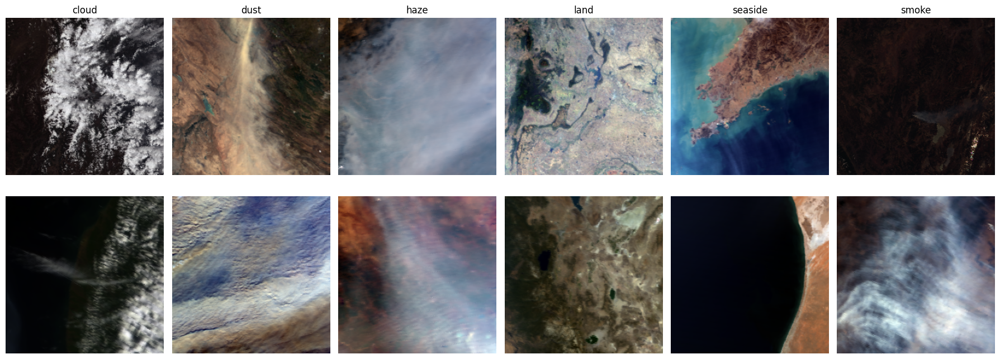

In [11]:
# Visualise 2 sample images per class to inspect appearance
# ! REMOVE THE COMMENT THING

fig, axes = plt.subplots(2, 6, figsize=(18, 7))

for col, class_name in enumerate(class_names):
    idx = class_names.index(class_name)
    samples = [row for row in ustc if row["label"] == idx][:2]
    for row_i, s in enumerate(samples):
        axes[row_i][col].imshow(s["image"])
        axes[row_i][col].set_title(class_name if row_i == 0 else "")
        axes[row_i][col].axis("off")

plt.tight_layout()
plt.show()

### Data Preprocessing

In [12]:
# Resize function: PIL image -> uint8 numpy array at 224x224
TARGET_SIZE = (224, 224)

def load_ustc(pil_image):
    img = pil_image.resize(TARGET_SIZE, Image.BILINEAR)
    return np.array(img)

# verify
sample = load_ustc(ustc[0]["image"])
print(f"USTC loaded shape: {sample.shape}")

USTC loaded shape: (224, 224, 3)


In [13]:
# Build index DataFrame (index, label, class) for all 6,225 images
pool = pd.DataFrame([
    {"index": i, "label": row["label"], "class": class_names[row["label"]]}
    for i, row in enumerate(ustc)
])

print(pool.groupby("class")["label"].count().rename("count"))
print(f"\nTotal: {len(pool)}")

pool.head()

class
cloud      1164
dust       1009
haze       1002
land       1027
seaside    1007
smoke      1016
Name: count, dtype: int64

Total: 6225


,index,label,class
0,0,0,cloud
1,1,0,cloud
2,2,0,cloud
3,3,0,cloud
4,4,0,cloud


In [14]:
# Stratified 60/20/20 train/val/test split (fixed random seed)
train_val, test = train_test_split(pool, test_size=0.20, stratify=pool["label"], random_state=42)
train, val      = train_test_split(train_val, test_size=0.25, stratify=train_val["label"], random_state=42)

print(f"Train : {len(train)}  Val : {len(val)}  Test : {len(test)}")

Train : 3735  Val : 1245  Test : 1245


In [15]:
# Print per-class image counts for each split
splits = {"train": train, "val": val, "test": test}

rows = []
for name in class_names:
    row = {"class": name}
    for split_name, df in splits.items():
        row[split_name] = (df["class"] == name).sum()
    rows.append(row)

df_split = pd.DataFrame(rows).set_index("class")
df_split["total"] = df_split.sum(axis=1)
for col in ["train", "val", "test"]:
    df_split[f"{col}%"] = (df_split[col] / df_split["total"] * 100).round(1)

df_split[["train", "val", "test", "train%", "val%", "test%"]]

,train,val,test,train%,val%,test%
class,,,,,,
cloud,698,233,233,60.0,20.0,20.0
dust,605,202,202,60.0,20.0,20.0
haze,602,200,200,60.1,20.0,20.0
land,616,206,205,60.0,20.1,20.0
seaside,604,201,202,60.0,20.0,20.1
smoke,610,203,203,60.0,20.0,20.0


### EDA (Training Set)

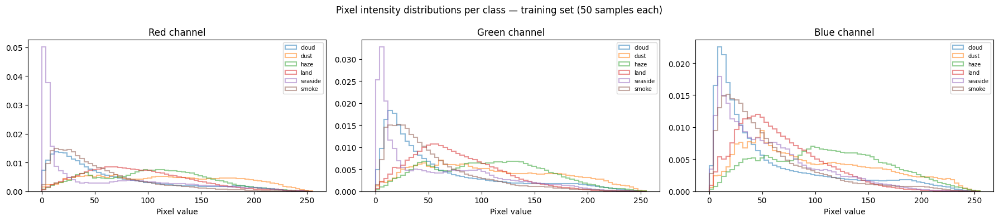

In [16]:
# Sample 50 images per class; compute per-channel pixel arrays for EDA
N_SAMPLE = 50
channel_labels = ["Red", "Green", "Blue"]
class_colors = plt.cm.tab10.colors

samples_per_class = {
    name: [ustc[i] for i in train[train["class"] == name]["index"].tolist()[:N_SAMPLE]]
    for name in class_names
}

def sample_pixels_ustc(rows):
    pixels = [[], [], []]
    for row in rows:
        img = np.array(row["image"])
        for c in range(3):
            pixels[c].append(img[:, :, c].flatten())
    return [np.concatenate(ch) for ch in pixels]

class_pixels = {name: sample_pixels_ustc(samples_per_class[name]) for name in class_names}

fig, axes = plt.subplots(1, 3, figsize=(18, 4))
for c, ax in enumerate(axes):
    for i, name in enumerate(class_names):
        ax.hist(class_pixels[name][c], bins=64, range=(0, 255), alpha=0.5,
                color=class_colors[i], label=name, density=True, histtype="step", linewidth=1.5)
    ax.set_title(f"{channel_labels[c]} channel")
    ax.set_xlabel("Pixel value")
    ax.legend(fontsize=7)

plt.suptitle("Pixel intensity distributions per class — training set (50 samples each)")
plt.tight_layout()
plt.show()

In [17]:
# Print per-class RGB channel mean and std
for name in class_names:
    px = class_pixels[name]
    for c, ch in enumerate(channel_labels):
        print(f"{name:<10} {ch:6}: mean={px[c].mean():.1f}  std={px[c].std():.1f}")

cloud      Red   : mean=64.5  std=56.8
cloud      Green : mean=61.9  std=57.4
cloud      Blue  : mean=59.5  std=58.5
dust       Red   : mean=115.3  std=63.2
dust       Green : mean=107.7  std=61.4
dust       Blue  : mean=98.1  std=60.8
haze       Red   : mean=103.0  std=51.2
haze       Green : mean=106.1  std=52.5
haze       Blue  : mean=109.9  std=54.8
land       Red   : mean=90.3  std=47.7
land       Green : mean=75.9  std=41.3
land       Blue  : mean=66.6  std=39.3
seaside    Red   : mean=55.5  std=61.8
seaside    Green : mean=56.4  std=54.5
seaside    Blue  : mean=57.3  std=45.5
smoke      Red   : mean=53.2  std=42.4
smoke      Green : mean=53.4  std=43.1
smoke      Blue  : mean=55.2  std=46.3


In [18]:
# Compute mean brightness and variance per class
rows_eda = []
for name in class_names:
    for row in samples_per_class[name]:
        img = np.array(row["image"]).astype(np.float64)
        rows_eda.append({"class": name, "mean": img.mean(), "std": img.std()})

df_eda = pd.DataFrame(rows_eda)
df_eda.groupby("class")[["mean", "std"]].mean().round(1).rename(columns={"mean": "avg brightness"})

,avg brightness,std
class,,
cloud,62.0,47.2
dust,107.0,41.7
haze,106.3,37.6
land,77.6,35.9
seaside,56.4,47.2
smoke,53.9,32.6


### Data Filtering

#### Checking for duplicates

In [19]:
# Average-hash duplicate detection across all 6,225 images
def ahash(pil_image, hash_size=12):
    img = pil_image.convert("L").resize((hash_size, hash_size), Image.BILINEAR)
    arr = np.array(img, dtype=np.float32)
    return int(np.packbits((arr > arr.mean()).flatten()).tobytes().hex(), 16)

seen = {}
duplicate_indices = []
for i in pool["index"]:
    h = ahash(ustc[i]["image"])
    if h in seen:
        duplicate_indices.append(i)
    else:
        seen[h] = i

print(f"Images checked   : {len(pool)}")
print(f"Duplicates found : {len(duplicate_indices)}")
if duplicate_indices:
    print(f"Flagged indices  : {duplicate_indices}")

Images checked   : 6225
Duplicates found : 1
Flagged indices  : [5196]


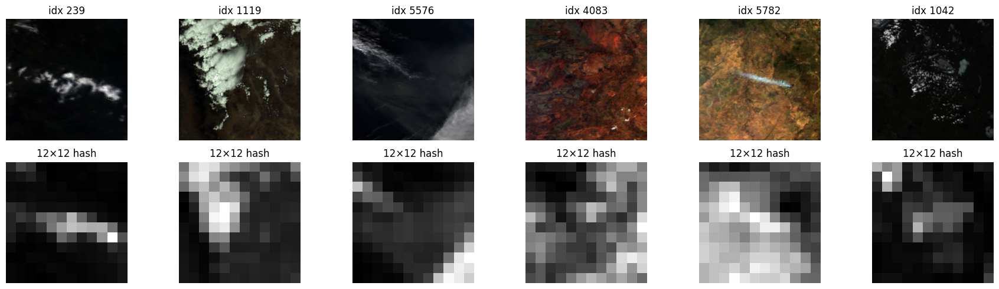

In [20]:
# Visualise how average hashing works on sample images
# THIS WAS MADE TO HELP US UNDERSTAND HOW THE HASHING ACTUALLY WORK 

n_show = 6
sample_indices = pool["index"].sample(n_show, random_state=42).tolist()

fig, axes = plt.subplots(2, n_show, figsize=(18, 5))
for col, idx in enumerate(sample_indices):
    img_orig = ustc[idx]["image"]
    img_small = img_orig.convert("L").resize((12, 12), Image.BILINEAR)

    axes[0][col].imshow(img_orig)
    axes[0][col].set_title(f"idx {idx}")
    axes[0][col].axis("off")

    axes[1][col].imshow(img_small, cmap="gray", interpolation="nearest")
    axes[1][col].set_title("12×12 hash")
    axes[1][col].axis("off")

plt.tight_layout()
plt.show()

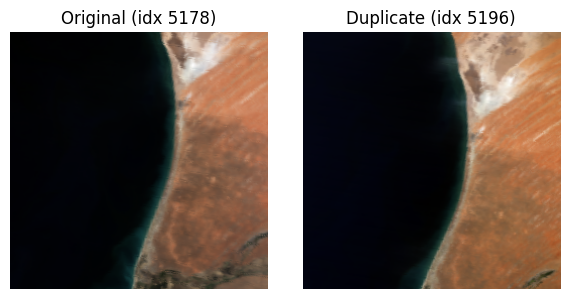

In [21]:
# Display flagged duplicate pairs side by side
if duplicate_indices:
    fig, axes = plt.subplots(len(duplicate_indices), 2, figsize=(6, 3 * len(duplicate_indices)))
    if len(duplicate_indices) == 1:
        axes = [axes]
    for ax_row, dup_idx in zip(axes, duplicate_indices):
        orig_idx = seen[ahash(ustc[dup_idx]["image"])]
        ax_row[0].imshow(ustc[orig_idx]["image"])
        ax_row[0].set_title(f"Original (idx {orig_idx})")
        ax_row[0].axis("off")
        ax_row[1].imshow(ustc[dup_idx]["image"])
        ax_row[1].set_title(f"Duplicate (idx {dup_idx})")
        ax_row[1].axis("off")
    plt.tight_layout()
    plt.show()
else:
    print("No duplicates to display.")


In [22]:
# Cross-validate duplicates with perceptual hash (phash)
# ANOTHER WAY TO CHECK FOR DUPLICATES

seen_ph = {}
duplicate_indices_ph = []
for i in pool["index"]:
    h = imagehash.phash(ustc[i]["image"])
    if h in seen_ph:
        duplicate_indices_ph.append(i)
    else:
        seen_ph[h] = i

print(f"Images checked   : {len(pool)}")
print(f"Duplicates found : {len(duplicate_indices_ph)}")
if duplicate_indices_ph:
    for dup_idx in duplicate_indices_ph:
        orig_idx = seen_ph[imagehash.phash(ustc[dup_idx]["image"])]
        print(f"  Flagged idx {dup_idx} matches idx {orig_idx}")

Images checked   : 6225
Duplicates found : 0


#### Check for currput or unreadable images

In [23]:
# Flag corrupt or unreadable images
corrupt_indices = []
for i in pool["index"]:
    try:
        img = np.array(ustc[i]["image"])
        assert img.ndim == 3 and img.shape[2] == 3
    except Exception:
        corrupt_indices.append(i)

print(f"Images checked  : {len(pool)}")
print(f"Corrupt found   : {len(corrupt_indices)}")
if corrupt_indices:
    print(f"Flagged indices : {corrupt_indices}")

Images checked  : 6225
Corrupt found   : 0


#### RGB anomalies

In [24]:
# Flag images with extreme mean pixel values (near-black or near-white)
anomaly_indices = []
for i in pool["index"]:
    avg = np.array(ustc[i]["image"]).mean()
    if avg < 5 or avg > 250:
        anomaly_indices.append(i)

print(f"Images checked  : {len(pool)}")
print(f"Anomalies found : {len(anomaly_indices)}")
if anomaly_indices:
    print(f"Flagged indices : {anomaly_indices}")

Images checked  : 6225
Anomalies found : 0


### Data Normalisation

In [25]:
# Normalisation: divide by 255 -> [0, 1] (used for CNN and SVM)
def normalise(img):
    return img.astype(np.float32) / 255.0

# verify
sample = load_ustc(ustc[0]["image"])
print(f"Before: min={sample.min()}  max={sample.max()}  dtype={sample.dtype}")
norm = normalise(sample)
print(f"After : min={norm.min():.1f}  max={norm.max():.1f}  dtype={norm.dtype}")

Before: min=6  max=245  dtype=uint8
After : min=0.0  max=1.0  dtype=float32


In [26]:
# ImageNet mean/std constants and normalise_imagenet() function (used for ResNet50)
IMAGENET_MEAN = np.array([0.485, 0.456, 0.406], dtype=np.float32)
IMAGENET_STD  = np.array([0.229, 0.224, 0.225], dtype=np.float32)

def normalise_imagenet(img):
    return (img.astype(np.float32) / 255.0 - IMAGENET_MEAN) / IMAGENET_STD

# verify
norm_in = normalise_imagenet(sample)
print(f"Shape : {norm_in.shape}")
print(f"Mean  : {norm_in.mean(axis=(0,1)).round(3)}  (expect near 0)")
print(f"Std   : {norm_in.std(axis=(0,1)).round(3)}   (expect near 1)")

Shape : (224, 224, 3)
Mean  : [-0.658 -0.6   -0.346]  (expect near 0)
Std   : [1.118 1.175 1.18 ]   (expect near 1)


In [27]:
# load_split(): load a split DataFrame into (X, y) numpy arrays
def load_split(df, normalise_fn):
    X = np.stack([normalise_fn(load_ustc(ustc[i]["image"])) for i in df["index"]])
    y = df["label"].values
    return X, y

# verify on a small sample
sample_df = train.sample(5, random_state=0)
X_sample, y_sample = load_split(sample_df, normalise)
print(f"Shape : {X_sample.shape}  dtype: {X_sample.dtype}")
print(f"Range : [{X_sample.min():.2f}, {X_sample.max():.2f}]")
print(f"Labels: {y_sample}")

Shape : (5, 224, 224, 3)  dtype: float32
Range : [0.00, 0.99]
Labels: [4 0 4 5 5]


### Data Augmentation (training set only)

In [28]:
# Augmentation functions: flip, rotate, brightness, Gaussian noise
def aug_flip(img):
    return img.transpose(Image.FLIP_LEFT_RIGHT)

def aug_rotate(img):
    return img.rotate(random.choice([90, 180, 270]))

def aug_brightness(img):
    return ImageEnhance.Brightness(img).enhance(random.uniform(0.5, 2))

def aug_noise(img):
    arr = np.array(img, dtype=np.float32)
    arr += np.random.normal(0, 10, arr.shape)
    return Image.fromarray(np.clip(arr, 0, 255).astype(np.uint8))

AUG_FUNCS  = [aug_flip, aug_rotate, aug_brightness, aug_noise]
AUG_LABELS = ["flip", "rotate", "brightness", "noise"]

In [29]:
# Expand training set 5x: original + 4 augmented copies
original = train.assign(aug=0, aug_label="original")
augmented = [train.assign(aug=i+1, aug_label=label) for i, label in enumerate(AUG_LABELS)]

train_aug = pd.concat([original] + augmented, ignore_index=True)

print(f"Before augmentation : {len(train):>5} images")
print(f"After augmentation  : {len(train_aug):>5} images  ({len(train_aug)//len(train)}×)")

Before augmentation :  3735 images
After augmentation  : 18675 images  (5×)


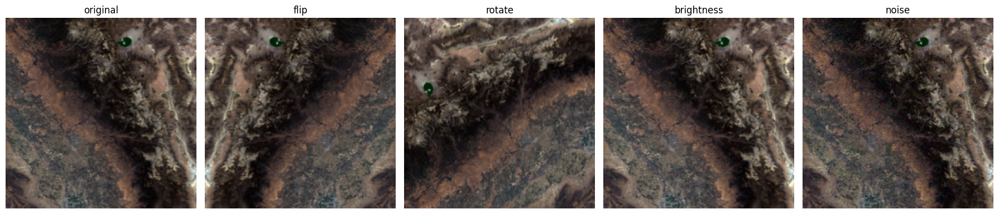

In [30]:
# Visualise all augmentation variants for one sample image
sample_idx = train["index"].iloc[0]
pil_img = ustc[sample_idx]["image"]

aug_versions = [("original", pil_img)] + [(label, fn(pil_img)) for label, fn in zip(AUG_LABELS, AUG_FUNCS)]

fig, axes = plt.subplots(1, len(aug_versions), figsize=(18, 4))
for ax, (label, img) in zip(axes, aug_versions):
    ax.imshow(img)
    ax.set_title(label)
    ax.axis("off")

plt.tight_layout()
plt.show()

### Data Pipeline

In [31]:
# Load val and test arrays into memory (both normalisations)
X_val_norm,      y_val  = load_split(val,  normalise)
X_test_norm,     y_test = load_split(test, normalise)
X_val_imagenet,  _      = load_split(val,  normalise_imagenet)
X_test_imagenet, _      = load_split(test, normalise_imagenet)

print(f"X_val_norm      : {X_val_norm.shape}   [{X_val_norm.min():.2f}, {X_val_norm.max():.2f}]")
print(f"X_test_norm     : {X_test_norm.shape}   [{X_test_norm.min():.2f}, {X_test_norm.max():.2f}]")
print(f"X_val_imagenet  : {X_val_imagenet.shape}")
print(f"X_test_imagenet : {X_test_imagenet.shape}")

X_val_norm      : (1245, 224, 224, 3)   [0.00, 1.00]
X_test_norm     : (1245, 224, 224, 3)   [0.00, 1.00]
X_val_imagenet  : (1245, 224, 224, 3)
X_test_imagenet : (1245, 224, 224, 3)


In [32]:
# Load training arrays into memory
X_train_norm,      y_train = load_split(train, normalise)
X_train_imagenet,  _       = load_split(train, normalise_imagenet)

print(f"X_train_norm     : {X_train_norm.shape}   {X_train_norm.nbytes / 1e9:.2f} GB")
print(f"X_train_imagenet : {X_train_imagenet.shape}   {X_train_imagenet.nbytes / 1e9:.2f} GB")

X_train_norm     : (3735, 224, 224, 3)   2.25 GB
X_train_imagenet : (3735, 224, 224, 3)   2.25 GB


In [33]:
# load_aug_split(): load augmented training DataFrame into (X, y) arrays
def load_aug_split(df, normalise_fn):
    aug_fns = {1: aug_flip, 2: aug_rotate, 3: aug_brightness, 4: aug_noise}
    X, y = [], []
    for _, row in df.iterrows():
        pil = ustc[row["index"]]["image"]
        if row["aug"] > 0:
            pil = aug_fns[row["aug"]](pil)
        X.append(normalise_fn(load_ustc(pil)))
        y.append(row["label"])
    return np.stack(X), np.array(y)

In [30]:
# Print pipeline summary: array shapes and split sizes
print("Pipeline ready")
print(f"  X_train_norm     : {X_train_norm.shape}   (SVM + CNN baseline)")
print(f"  X_train_imagenet : {X_train_imagenet.shape}   (Transfer Learning)")
print(f"  X_val_norm       : {X_val_norm.shape}   y_val:  {y_val.shape}")
print(f"  X_val_imagenet   : {X_val_imagenet.shape}")
print(f"  X_test_norm      : {X_test_norm.shape}   y_test: {y_test.shape}")
print(f"  X_test_imagenet  : {X_test_imagenet.shape}")
print(f"  load_aug_split() : ready — call with (train_aug, normalise) for CNN augmented training")

Pipeline ready
  X_train_norm     : (3735, 224, 224, 3)   (SVM + CNN baseline)
  X_train_imagenet : (3735, 224, 224, 3)   (Transfer Learning)
  X_val_norm       : (1245, 224, 224, 3)   y_val:  (1245,)
  X_val_imagenet   : (1245, 224, 224, 3)
  X_test_norm      : (1245, 224, 224, 3)   y_test: (1245,)
  X_test_imagenet  : (1245, 224, 224, 3)
  load_aug_split() : ready — call with (train_aug, normalise) for CNN augmented training


### SVM

In [33]:
X_train_flat = X_train_norm.reshape(len(X_train_norm), -1)
X_test_flat  = X_test_norm.reshape(len(X_test_norm), -1)

print(f"Flattened shape : {X_train_flat.shape}")

_pca = PCA(n_components=200, random_state=42).fit(X_train_flat)
print(f"Variance explained by 200 components: {_pca.explained_variance_ratio_.sum():.1%}")
del _pca

Flattened shape : (3735, 150528)
Variance explained by 200 components: 94.2%


In [36]:
pipe_svm = Pipeline([
    ('pca',    PCA(n_components=200, random_state=42)),
    ('scaler', StandardScaler()),
    ('svm',    SVC(decision_function_shape='ovr', random_state=42))
])

param_grid = [{'svm__kernel': ['rbf'],
               'svm__C':     [0.1, 1, 10, 100],
               'svm__gamma': ['scale', 'auto']}]

gs_svm = GridSearchCV(pipe_svm, param_grid, cv=5, scoring='accuracy',
                      n_jobs=1, verbose=2)

t_svm = time.time()
gs_svm.fit(X_train_flat, y_train)
svm_time = time.time() - t_svm

print(f"Best params   : {gs_svm.best_params_}")
print(f"Best CV acc   : {gs_svm.best_score_:.4f}")
print(f"Training time : {svm_time:.0f}s  ({svm_time/60:.1f} min)")
svm_model = gs_svm.best_estimator_

Fitting 5 folds for each of 8 candidates, totalling 40 fits
[CV] END ......svm__C=0.1, svm__gamma=scale, svm__kernel=rbf; total time=  15.0s
[CV] END ......svm__C=0.1, svm__gamma=scale, svm__kernel=rbf; total time=  15.0s
[CV] END ......svm__C=0.1, svm__gamma=scale, svm__kernel=rbf; total time=  15.7s
[CV] END ......svm__C=0.1, svm__gamma=scale, svm__kernel=rbf; total time=  15.3s
[CV] END ......svm__C=0.1, svm__gamma=scale, svm__kernel=rbf; total time=  15.0s
[CV] END .......svm__C=0.1, svm__gamma=auto, svm__kernel=rbf; total time=  15.4s
[CV] END .......svm__C=0.1, svm__gamma=auto, svm__kernel=rbf; total time=  15.3s
[CV] END .......svm__C=0.1, svm__gamma=auto, svm__kernel=rbf; total time=  15.3s
[CV] END .......svm__C=0.1, svm__gamma=auto, svm__kernel=rbf; total time=  15.2s
[CV] END .......svm__C=0.1, svm__gamma=auto, svm__kernel=rbf; total time=  15.1s
[CV] END ........svm__C=1, svm__gamma=scale, svm__kernel=rbf; total time=  15.0s
[CV] END ........svm__C=1, svm__gamma=scale, svm_

In [34]:
# ╔══════════════════════════════════════════════════════════════════╗
# ║  ⚠  LOAD CELL — REMOVE THIS CELL BEFORE HAND-IN               ║
# ║  In development: comment out the training cell above and        ║
# ║  run this cell instead to skip re-training.                     ║
# ╚══════════════════════════════════════════════════════════════════╝
svm_model = joblib.load('svm_model.pkl')
print('Model loaded: svm_model.pkl')
print('Training time : 603s  (10.1 min)')
print('Best params   : {svm__C: 1, svm__gamma: scale, svm__kernel: rbf}')
print('Best CV acc   : 0.4937')


Model loaded: svm_model.pkl
Training time : 603s  (10.1 min)
Best params   : {svm__C: 1, svm__gamma: scale, svm__kernel: rbf}
Best CV acc   : 0.4937


In [35]:
y_pred_svm = svm_model.predict(X_test_flat)
print(classification_report(y_test, y_pred_svm, target_names=class_names))


              precision    recall  f1-score   support

       cloud       0.52      0.58      0.54       233
        dust       0.50      0.49      0.49       202
        haze       0.56      0.59      0.58       200
        land       0.49      0.43      0.46       205
     seaside       0.71      0.48      0.57       202
       smoke       0.43      0.57      0.49       203

    accuracy                           0.52      1245
   macro avg       0.54      0.52      0.52      1245
weighted avg       0.54      0.52      0.52      1245



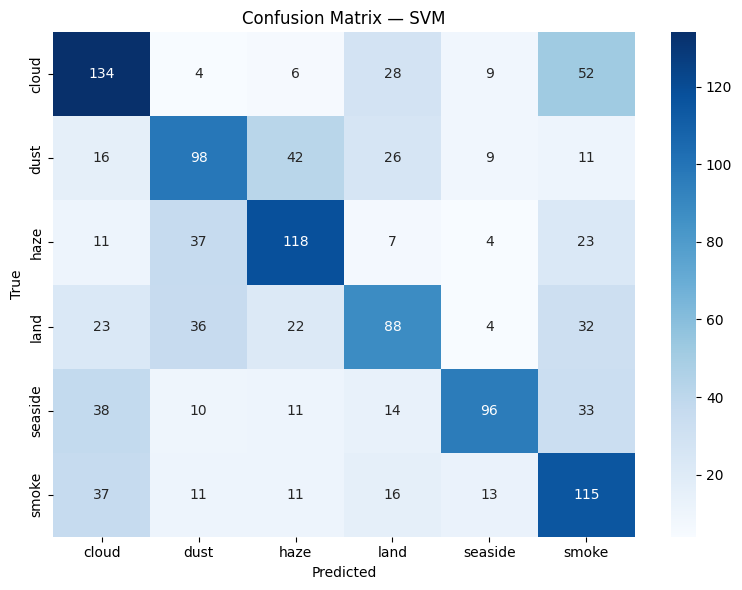

In [36]:
cm = confusion_matrix(y_test, y_pred_svm)
fig, ax = plt.subplots(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_names, yticklabels=class_names, ax=ax)
ax.set_xlabel('Predicted')
ax.set_ylabel('True')
ax.set_title('Confusion Matrix — SVM')
plt.tight_layout()
plt.show()

### ResNet50 Transfer Learning

In [38]:
def build_resnet50():
    base = ResNet50(weights="imagenet", include_top=False, input_shape=(224, 224, 3))
    x = tf.keras.layers.GlobalAveragePooling2D()(base.output)
    x = tf.keras.layers.Dense(256)(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.Activation("relu")(x)
    x = tf.keras.layers.Dropout(0.3)(x)
    out = tf.keras.layers.Dense(6, activation="softmax")(x)
    return tf.keras.Model(inputs=base.input, outputs=out), base

model_rn, base_rn = build_resnet50()
print(f"Total layers : {len(model_rn.layers)}")
print(f"Total params : {model_rn.count_params():,}")

Total layers : 181
Total params : 24,114,822


In [46]:
def augment_imagenet(x, y):
    x = tf.image.random_flip_left_right(x)
    k = tf.random.uniform(shape=[], minval=0, maxval=4, dtype=tf.int32)
    x = tf.image.rot90(x, k)
    x = tf.image.random_brightness(x, max_delta=0.5)
    x = x + tf.random.normal(shape=tf.shape(x), mean=0.0, stddev=10.0/255.0)
    return x, y

with tf.device('/CPU:0'):
    train_ds_rn = (tf.data.Dataset.from_tensor_slices((X_train_imagenet, y_train))
                   .shuffle(len(X_train_imagenet), seed=42)
                   .batch(32)
                   .map(augment_imagenet, num_parallel_calls=tf.data.AUTOTUNE)
                   .prefetch(tf.data.AUTOTUNE))

    val_ds_rn = (tf.data.Dataset.from_tensor_slices((X_val_imagenet, y_val))
                 .batch(32)
                 .prefetch(tf.data.AUTOTUNE))

for layer in base_rn.layers:
    layer.trainable = False

model_rn.compile(
    optimizer=tf.keras.optimizers.Adam(1e-3),
    loss="sparse_categorical_crossentropy",
    metrics=["accuracy"]
)

cb_phase1 = [tf.keras.callbacks.EarlyStopping(
    monitor="val_loss", patience=15, restore_best_weights=True, verbose=1
)]

t_phase1 = time.time()
hist1 = model_rn.fit(
    train_ds_rn,
    validation_data=val_ds_rn,
    epochs=150,
    callbacks=cb_phase1,
    verbose=1
)
phase1_time = time.time() - t_phase1
print(f"\nPhase 1 done in {phase1_time:.0f}s")

Epoch 1/150
117/117 [==============================] - 14s 94ms/step - loss: 1.3292 - accuracy: 0.4902 - val_loss: 1.5708 - val_accuracy: 0.4048
Epoch 2/150
117/117 [==============================] - 9s 76ms/step - loss: 1.1427 - accuracy: 0.5620 - val_loss: 1.7211 - val_accuracy: 0.4337
Epoch 3/150
117/117 [==============================] - 9s 76ms/step - loss: 1.0841 - accuracy: 0.5845 - val_loss: 1.3403 - val_accuracy: 0.4731
Epoch 4/150
117/117 [==============================] - 10s 77ms/step - loss: 1.0277 - accuracy: 0.6137 - val_loss: 1.2470 - val_accuracy: 0.5213
Epoch 5/150
117/117 [==============================] - 9s 76ms/step - loss: 1.0199 - accuracy: 0.6185 - val_loss: 1.1810 - val_accuracy: 0.5614
Epoch 6/150
117/117 [==============================] - 9s 75ms/step - loss: 0.9833 - accuracy: 0.6297 - val_loss: 1.0025 - val_accuracy: 0.6297
Epoch 7/150
117/117 [==============================] - 9s 74ms/step - loss: 0.9593 - accuracy: 0.6450 - val_loss: 1.3946 - val_accurac

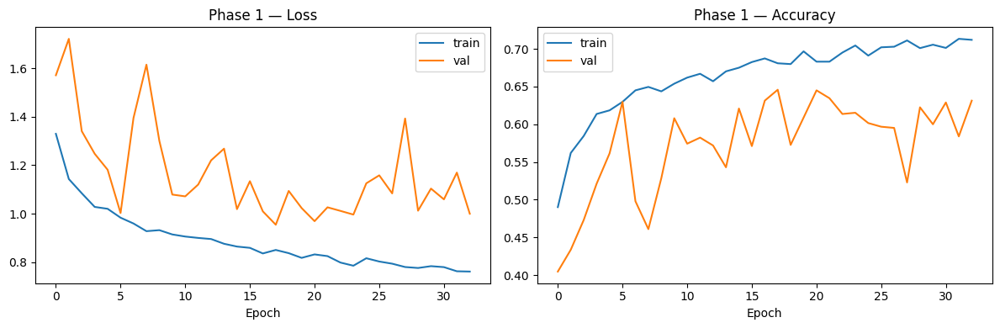

In [47]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))

ax1.plot(hist1.history["loss"], label="train")
ax1.plot(hist1.history["val_loss"], label="val")
ax1.set_title("Phase 1 — Loss")
ax1.set_xlabel("Epoch")
ax1.legend()

ax2.plot(hist1.history["accuracy"], label="train")
ax2.plot(hist1.history["val_accuracy"], label="val")
ax2.set_title("Phase 1 — Accuracy")
ax2.set_xlabel("Epoch")
ax2.legend()

plt.tight_layout()
plt.show()

In [48]:
for layer in base_rn.layers:
    layer.trainable = False
for layer in base_rn.layers[-30:]:
    layer.trainable = True

model_rn.compile(
    optimizer=tf.keras.optimizers.Adam(1e-5),
    loss="sparse_categorical_crossentropy",
    metrics=["accuracy"]
)

cb_phase2 = [
    tf.keras.callbacks.EarlyStopping(
        monitor="val_loss", patience=15, restore_best_weights=True, verbose=1
    ),
    tf.keras.callbacks.ReduceLROnPlateau(
        monitor="val_loss", factor=0.5, patience=3, min_lr=1e-7, verbose=1
    )
]

t_phase2 = time.time()
hist2 = model_rn.fit(
    train_ds_rn,
    validation_data=val_ds_rn,
    epochs=150,
    callbacks=cb_phase2,
    verbose=1
)
phase2_time = time.time() - t_phase2
print(f"\nPhase 2 done in {phase2_time:.0f}s")

Epoch 1/150
117/117 [==============================] - 14s 95ms/step - loss: 1.3870 - accuracy: 0.5133 - val_loss: 1.6755 - val_accuracy: 0.4321 - lr: 1.0000e-05
Epoch 2/150
117/117 [==============================] - 10s 84ms/step - loss: 1.0780 - accuracy: 0.5960 - val_loss: 1.2578 - val_accuracy: 0.5205 - lr: 1.0000e-05
Epoch 3/150
117/117 [==============================] - 10s 84ms/step - loss: 0.9396 - accuracy: 0.6463 - val_loss: 1.0653 - val_accuracy: 0.6048 - lr: 1.0000e-05
Epoch 4/150
117/117 [==============================] - 10s 84ms/step - loss: 0.9014 - accuracy: 0.6627 - val_loss: 0.9527 - val_accuracy: 0.6394 - lr: 1.0000e-05
Epoch 5/150
117/117 [==============================] - 11s 87ms/step - loss: 0.8337 - accuracy: 0.7015 - val_loss: 0.8982 - val_accuracy: 0.6755 - lr: 1.0000e-05
Epoch 6/150
117/117 [==============================] - 10s 83ms/step - loss: 0.8022 - accuracy: 0.7098 - val_loss: 0.9221 - val_accuracy: 0.6755 - lr: 1.0000e-05
Epoch 7/150
117/117 [=======

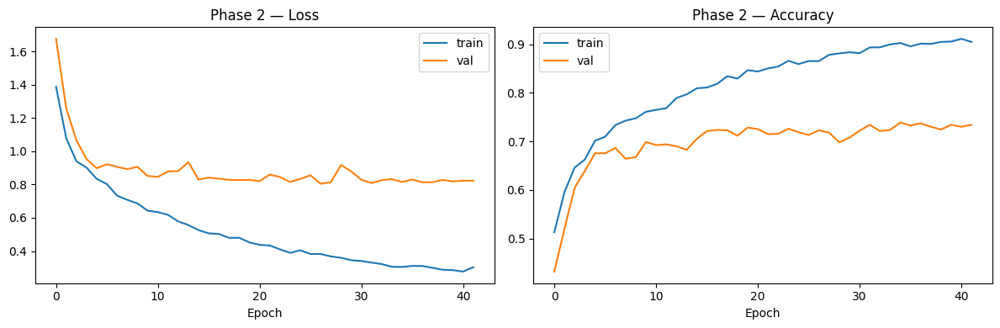

In [49]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))

ax1.plot(hist2.history["loss"], label="train")
ax1.plot(hist2.history["val_loss"], label="val")
ax1.set_title("Phase 2 — Loss")
ax1.set_xlabel("Epoch")
ax1.legend()

ax2.plot(hist2.history["accuracy"], label="train")
ax2.plot(hist2.history["val_accuracy"], label="val")
ax2.set_title("Phase 2 — Accuracy")
ax2.set_xlabel("Epoch")
ax2.legend()

plt.tight_layout()
plt.show()

In [50]:
y_pred_rn = model_rn.predict(X_test_imagenet, batch_size=32).argmax(axis=1)
print(classification_report(y_test, y_pred_rn, target_names=class_names))

39/39 [==============================] - 12s 50ms/step
              precision    recall  f1-score   support

       cloud       0.79      0.78      0.79       233
        dust       0.75      0.71      0.73       202
        haze       0.67      0.68      0.68       200
        land       0.72      0.82      0.77       205
     seaside       0.92      0.89      0.90       202
       smoke       0.62      0.59      0.60       203

    accuracy                           0.75      1245
   macro avg       0.75      0.74      0.74      1245
weighted avg       0.75      0.75      0.75      1245



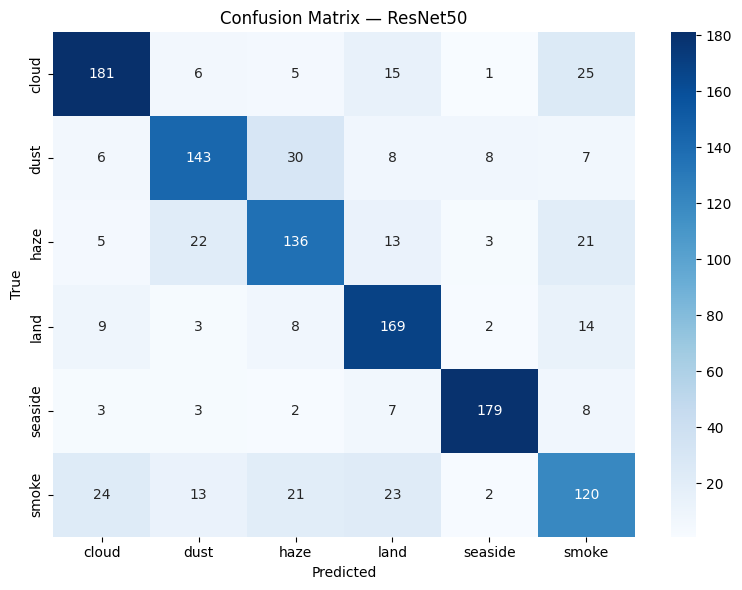

In [51]:
cm = confusion_matrix(y_test, y_pred_rn)
fig, ax = plt.subplots(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_names, yticklabels=class_names, ax=ax)
ax.set_xlabel('Predicted')
ax.set_ylabel('True')
ax.set_title('Confusion Matrix — ResNet50')
plt.tight_layout()
plt.show()

In [39]:
# ╔══════════════════════════════════════════════════════════════════╗
# ║  ⚠  LOAD CELL — REMOVE THIS CELL BEFORE HAND-IN               ║
# ║  In development: comment out the training cell above and        ║
# ║  run this cell instead to skip re-training.                     ║
# ╚══════════════════════════════════════════════════════════════════╝
model_rn = tf.keras.models.load_model("tuned_models/resnet50_finetuned.h5", compile=False)
print("Model loaded: resnet50_finetuned.h5")

Model loaded: resnet50_finetuned.h5


### Custom CNN original

In [43]:
def augment_batch(x, y):
    x = tf.image.random_flip_left_right(x)
    k = tf.random.uniform(shape=[], minval=0, maxval=4, dtype=tf.int32)
    x = tf.image.rot90(x, k)
    x = tf.image.random_brightness(x, max_delta=0.5)
    x = x + tf.random.normal(shape=tf.shape(x), mean=0.0, stddev=10.0/255.0)
    x = tf.clip_by_value(x, 0.0, 1.0)
    return x, y

In [44]:
def build_cnn(input_shape=(224, 224, 3), num_classes=6):
    inputs = tf.keras.Input(shape=input_shape)

    # Block 1
    x = tf.keras.layers.Conv2D(32, 3, padding='same')(inputs)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.ReLU()(x)
    x = tf.keras.layers.Conv2D(32, 3, padding='same')(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.ReLU()(x)
    x = tf.keras.layers.MaxPool2D(2)(x)
    x = tf.keras.layers.Dropout(0.25)(x)

    # Block 2
    x = tf.keras.layers.Conv2D(64, 3, padding='same')(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.ReLU()(x)
    x = tf.keras.layers.Conv2D(64, 3, padding='same')(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.ReLU()(x)
    x = tf.keras.layers.MaxPool2D(2)(x)
    x = tf.keras.layers.Dropout(0.25)(x)

    # Block 3
    x = tf.keras.layers.Conv2D(128, 3, padding='same')(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.ReLU()(x)
    x = tf.keras.layers.Conv2D(128, 3, padding='same')(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.ReLU()(x)
    x = tf.keras.layers.MaxPool2D(2)(x)
    x = tf.keras.layers.Dropout(0.25)(x)

    # Dense head
    x = tf.keras.layers.GlobalAveragePooling2D()(x)
    x = tf.keras.layers.Dense(256)(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.ReLU()(x)
    x = tf.keras.layers.Dropout(0.5)(x)
    outputs = tf.keras.layers.Dense(num_classes, activation='softmax')(x)

    return tf.keras.Model(inputs, outputs)

cnn = build_cnn()
cnn.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 conv2d (Conv2D)             (None, 224, 224, 32)      896       
                                                                 
 batch_normalization_1 (Batc  (None, 224, 224, 32)     128       
 hNormalization)                                                 
                                                                 
 re_lu (ReLU)                (None, 224, 224, 32)      0         
                                                                 
 conv2d_1 (Conv2D)           (None, 224, 224, 32)      9248      
                                                                 
 batch_normalization_2 (Batc  (None, 224, 224, 32)     128       
 hNormalization)                                           

In [45]:
cnn.compile(
    optimizer=tf.keras.optimizers.experimental.AdamW(learning_rate=1e-3),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

In [82]:
train_ds = (tf.data.Dataset.from_tensor_slices((X_train_norm, y_train))
            .shuffle(len(X_train_norm), seed=42)
            .batch(32)
            .map(augment_batch, num_parallel_calls=tf.data.AUTOTUNE)
            .prefetch(tf.data.AUTOTUNE))

val_ds = (tf.data.Dataset.from_tensor_slices((X_val_norm, y_val))
          .batch(32)
          .prefetch(tf.data.AUTOTUNE))

callbacks = [
    tf.keras.callbacks.EarlyStopping(patience=7, restore_best_weights=True, monitor='val_accuracy'),
    tf.keras.callbacks.ReduceLROnPlateau(patience=3, factor=0.5, monitor='val_loss', verbose=1),
    tf.keras.callbacks.ModelCheckpoint('cnn_best.h5', save_best_only=True, monitor='val_accuracy', verbose=1),
]

t_start = time.time()
history = cnn.fit(
    train_ds,
    validation_data=val_ds,
    epochs=50,
    callbacks=callbacks
)
cnn_train_time = time.time() - t_start
print(f"\nTraining time: {cnn_train_time:.0f}s  ({cnn_train_time/60:.1f} min)")

Epoch 1/50
117/117 [==============================] - ETA: 0s - loss: 1.3740 - accuracy: 0.5149
Epoch 1: val_accuracy improved from -inf to 0.16386, saving model to cnn_best.h5
117/117 [==============================] - 98s 145ms/step - loss: 1.3740 - accuracy: 0.5149 - val_loss: 2.0161 - val_accuracy: 0.1639 - lr: 0.0010
Epoch 2/50
117/117 [==============================] - ETA: 0s - loss: 1.1482 - accuracy: 0.5826
Epoch 2: val_accuracy improved from 0.16386 to 0.18554, saving model to cnn_best.h5
117/117 [==============================] - 15s 124ms/step - loss: 1.1482 - accuracy: 0.5826 - val_loss: 3.8411 - val_accuracy: 0.1855 - lr: 0.0010
Epoch 3/50
117/117 [==============================] - ETA: 0s - loss: 1.0399 - accuracy: 0.6126
Epoch 3: val_accuracy improved from 0.18554 to 0.32851, saving model to cnn_best.h5
117/117 [==============================] - 15s 124ms/step - loss: 1.0399 - accuracy: 0.6126 - val_loss: 2.3985 - val_accuracy: 0.3285 - lr: 0.0010
Epoch 4/50
117/117 [==

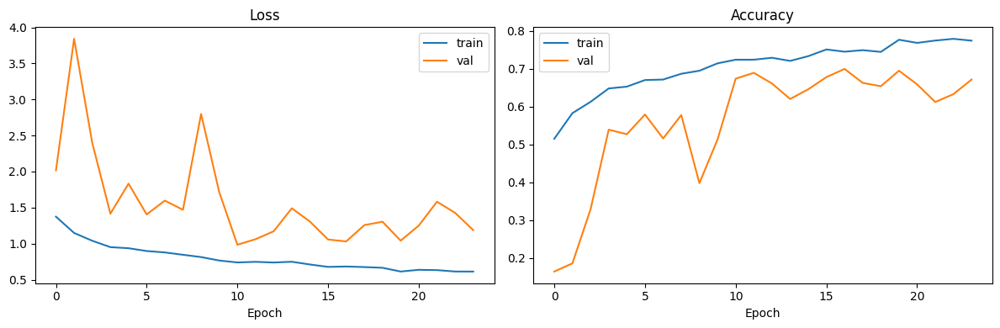

In [83]:
fig, axes = plt.subplots(1, 2, figsize=(12, 4))

axes[0].plot(history.history['loss'], label='train')
axes[0].plot(history.history['val_loss'], label='val')
axes[0].set_title('Loss')
axes[0].set_xlabel('Epoch')
axes[0].legend()

axes[1].plot(history.history['accuracy'], label='train')
axes[1].plot(history.history['val_accuracy'], label='val')
axes[1].set_title('Accuracy')
axes[1].set_xlabel('Epoch')
axes[1].legend()

plt.tight_layout()
plt.show()

In [84]:
y_pred_cnn = np.argmax(cnn.predict(X_val_norm), axis=1)
print(classification_report(y_val, y_pred_cnn, target_names=class_names))

39/39 [==============================] - 2s 33ms/step
              precision    recall  f1-score   support

       cloud       0.76      0.84      0.80       233
        dust       0.79      0.67      0.73       202
        haze       0.73      0.59      0.65       200
        land       0.73      0.72      0.73       205
     seaside       0.59      0.99      0.74       202
       smoke       0.61      0.33      0.43       203

    accuracy                           0.69      1245
   macro avg       0.70      0.69      0.68      1245
weighted avg       0.70      0.69      0.68      1245



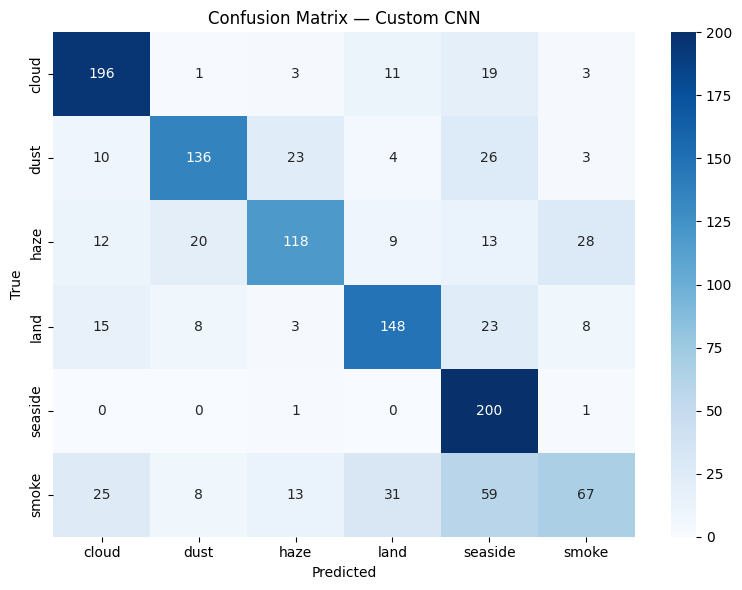

In [85]:
cm = confusion_matrix(y_val, y_pred_cnn)
fig, ax = plt.subplots(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_names, yticklabels=class_names, ax=ax)
ax.set_xlabel('Predicted')
ax.set_ylabel('True')
ax.set_title('Confusion Matrix — Custom CNN')
plt.tight_layout()
plt.show()

In [86]:
def gradcam(model, img, last_conv_name):
    grad_model = tf.keras.Model(
        inputs=model.inputs,
        outputs=[model.get_layer(last_conv_name).output, model.output]
    )
    with tf.GradientTape() as tape:
        conv_out, preds = grad_model(img[np.newaxis])
        pred_class = tf.argmax(preds[0])
        loss = preds[:, pred_class]
    grads = tape.gradient(loss, conv_out)
    pooled = tf.reduce_mean(grads, axis=(0, 1, 2))
    heatmap = tf.maximum(conv_out[0] @ pooled[..., tf.newaxis], 0)
    heatmap = tf.squeeze(heatmap)
    heatmap = heatmap / (tf.reduce_max(heatmap) + 1e-8)
    return heatmap.numpy(), int(pred_class)

def overlay_heatmap(img, heatmap, alpha=0.4):
    heatmap_up = np.array(Image.fromarray(np.uint8(255 * heatmap)).resize((224, 224), Image.BILINEAR))
    coloured = plt.cm.jet(heatmap_up / 255.0)[:, :, :3]
    return np.clip((1 - alpha) * img + alpha * coloured, 0, 1)

last_conv = [l.name for l in cnn.layers if isinstance(l, tf.keras.layers.Conv2D)][-1]
print(f"Grad-CAM target layer: {last_conv}")

Grad-CAM target layer: conv2d_17


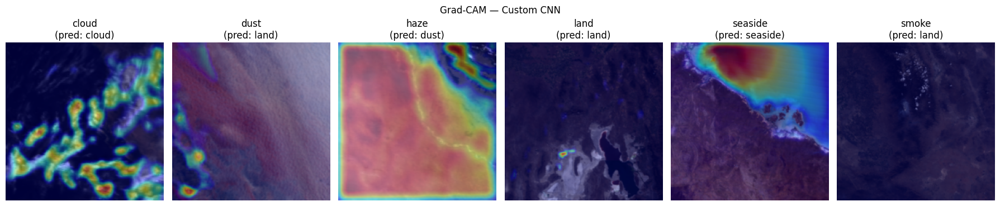

In [87]:
fig, axes = plt.subplots(1, len(class_names), figsize=(18, 4))
for ax, class_name in zip(axes, class_names):
    class_idx = class_names.index(class_name)
    idx = np.where(y_test == class_idx)[0][0]
    img = X_test_norm[idx]
    heatmap, pred = gradcam(cnn, img, last_conv)
    overlay = overlay_heatmap(img, heatmap)
    ax.imshow(overlay)
    ax.set_title(f"{class_name}\n(pred: {class_names[pred]})")
    ax.axis('off')

plt.suptitle("Grad-CAM — Custom CNN")
plt.tight_layout()
plt.show()

In [31]:
# ╔══════════════════════════════════════════════════════════════════╗
# ║  ⚠  LOAD CELL — REMOVE THIS CELL BEFORE HAND-IN               ║
# ║  In development: comment out the training cell above and        ║
# ║  run this cell instead to skip re-training.                     ║
# ╚══════════════════════════════════════════════════════════════════╝
cnn = tf.keras.models.load_model("tuned_models/cnn_model.h5", compile=False)
print("Model loaded: cnn_model.h5")

Model loaded: cnn_model.h5


### Tuning Setup 

In [34]:
def gradcam(model, img, last_conv_name):
    grad_model = tf.keras.Model(
        inputs=model.inputs,
        outputs=[model.get_layer(last_conv_name).output, model.output]
    )
    with tf.GradientTape() as tape:
        outputs = grad_model(img[np.newaxis])
        conv_out = outputs[0]
        preds = outputs[1]
        if isinstance(preds, list):
            preds = tf.stack(preds)
        tape.watch(conv_out)
        pred_class = int(np.argmax(preds.numpy().flatten()))
        loss = tf.gather(tf.reshape(preds, [-1]), pred_class)
    grads = tape.gradient(loss, conv_out)
    pooled = tf.reduce_mean(grads, axis=(0, 1, 2))
    heatmap = tf.maximum(conv_out[0] @ pooled[..., tf.newaxis], 0)
    heatmap = tf.squeeze(heatmap)
    heatmap = heatmap / (tf.reduce_max(heatmap) + 1e-8)
    return heatmap.numpy(), pred_class

def overlay_heatmap(img, heatmap, alpha=0.4):
    heatmap_up = np.array(Image.fromarray(np.uint8(255 * heatmap)).resize((224, 224), Image.BILINEAR))
    coloured = plt.cm.jet(heatmap_up / 255.0)[:, :, :3]
    return np.clip((1 - alpha) * img + alpha * coloured, 0, 1)


### V1 — 4th Block

In [33]:
def build_cnn_v1(input_shape=(224, 224, 3), num_classes=6):
    inputs = tf.keras.Input(shape=input_shape)

    x = tf.keras.layers.Conv2D(32, 3, padding='same')(inputs)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.ReLU()(x)
    x = tf.keras.layers.Conv2D(32, 3, padding='same')(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.ReLU()(x)
    x = tf.keras.layers.MaxPool2D(2)(x)
    x = tf.keras.layers.Dropout(0.25)(x)

    x = tf.keras.layers.Conv2D(64, 3, padding='same')(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.ReLU()(x)
    x = tf.keras.layers.Conv2D(64, 3, padding='same')(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.ReLU()(x)
    x = tf.keras.layers.MaxPool2D(2)(x)
    x = tf.keras.layers.Dropout(0.25)(x)

    x = tf.keras.layers.Conv2D(128, 3, padding='same')(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.ReLU()(x)
    x = tf.keras.layers.Conv2D(128, 3, padding='same')(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.ReLU()(x)
    x = tf.keras.layers.MaxPool2D(2)(x)
    x = tf.keras.layers.Dropout(0.25)(x)

    x = tf.keras.layers.Conv2D(256, 3, padding='same')(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.ReLU()(x)
    x = tf.keras.layers.Conv2D(256, 3, padding='same')(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.ReLU()(x)
    x = tf.keras.layers.MaxPool2D(2)(x)
    x = tf.keras.layers.Dropout(0.25)(x)

    # Dense head
    x = tf.keras.layers.GlobalAveragePooling2D()(x)
    x = tf.keras.layers.Dense(256)(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.ReLU()(x)
    x = tf.keras.layers.Dropout(0.5)(x)
    outputs = tf.keras.layers.Dense(num_classes, activation='softmax')(x)

    return tf.keras.Model(inputs, outputs)

cnn_v1 = build_cnn_v1()
cnn_v1.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 conv2d (Conv2D)             (None, 224, 224, 32)      896       
                                                                 
 batch_normalization (BatchN  (None, 224, 224, 32)     128       
 ormalization)                                                   
                                                                 
 re_lu (ReLU)                (None, 224, 224, 32)      0         
                                                                 
 conv2d_1 (Conv2D)           (None, 224, 224, 32)      9248      
                                                                 
 batch_normalization_1 (Batc  (None, 224, 224, 32)     128       
 hNormalization)                                             

In [34]:
cnn_v1.compile(
    optimizer=tf.keras.optimizers.experimental.AdamW(learning_rate=1e-3),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

In [52]:
callbacks_v1 = [
    tf.keras.callbacks.EarlyStopping(patience=7, restore_best_weights=True, monitor='val_accuracy'),
    tf.keras.callbacks.ReduceLROnPlateau(patience=3, factor=0.5, monitor='val_loss', verbose=1),
    tf.keras.callbacks.ModelCheckpoint('cnn_v1_best.h5', save_best_only=True, monitor='val_accuracy', verbose=1),
]

t_start = time.time()
history_v1 = cnn_v1.fit(
    train_ds,
    validation_data=val_ds,
    epochs=50,
    callbacks=callbacks_v1
)
cnn_v1_train_time = time.time() - t_start
print(f"\nTraining time: {cnn_v1_train_time:.0f}s  ({cnn_v1_train_time/60:.1f} min)")

Epoch 1/50
117/117 [==============================] - ETA: 0s - loss: 1.4080 - accuracy: 0.5015
Epoch 1: val_accuracy improved from -inf to 0.11325, saving model to cnn_v1_best.h5
117/117 [==============================] - 22s 140ms/step - loss: 1.4080 - accuracy: 0.5015 - val_loss: 5.4132 - val_accuracy: 0.1133 - lr: 0.0010
Epoch 2/50
117/117 [==============================] - ETA: 0s - loss: 1.2178 - accuracy: 0.5483
Epoch 2: val_accuracy improved from 0.11325 to 0.16064, saving model to cnn_v1_best.h5
117/117 [==============================] - 16s 132ms/step - loss: 1.2178 - accuracy: 0.5483 - val_loss: 6.5939 - val_accuracy: 0.1606 - lr: 0.0010
Epoch 3/50
117/117 [==============================] - ETA: 0s - loss: 1.0710 - accuracy: 0.6072
Epoch 3: val_accuracy improved from 0.16064 to 0.40803, saving model to cnn_v1_best.h5
117/117 [==============================] - 16s 131ms/step - loss: 1.0710 - accuracy: 0.6072 - val_loss: 2.1552 - val_accuracy: 0.4080 - lr: 0.0010
Epoch 4/50
11

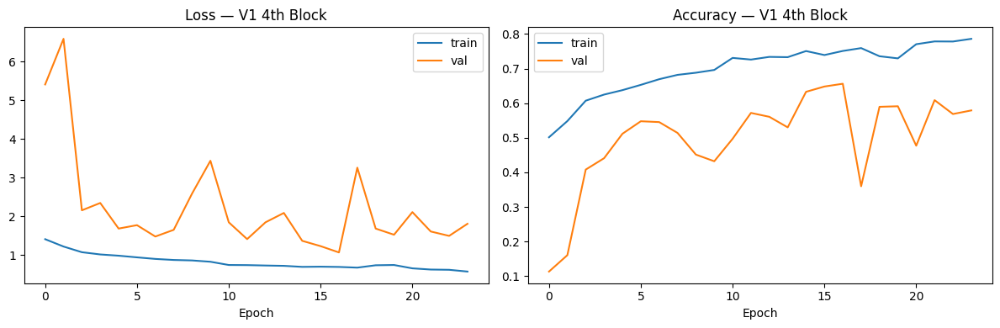

In [53]:
fig, axes = plt.subplots(1, 2, figsize=(12, 4))

axes[0].plot(history_v1.history['loss'], label='train')
axes[0].plot(history_v1.history['val_loss'], label='val')
axes[0].set_title('Loss — V1 4th Block')
axes[0].set_xlabel('Epoch')
axes[0].legend()

axes[1].plot(history_v1.history['accuracy'], label='train')
axes[1].plot(history_v1.history['val_accuracy'], label='val')
axes[1].set_title('Accuracy — V1 4th Block')
axes[1].set_xlabel('Epoch')
axes[1].legend()

plt.tight_layout()
plt.show()

In [36]:
y_pred_v1 = np.argmax(cnn_v1.predict(X_val_norm), axis=1)
print(classification_report(y_val, y_pred_v1, target_names=class_names))

39/39 [==============================] - 14s 32ms/step
              precision    recall  f1-score   support

       cloud       0.78      0.72      0.75       233
        dust       0.76      0.55      0.64       202
        haze       0.69      0.53      0.60       200
        land       0.78      0.69      0.73       206
     seaside       0.53      1.00      0.69       201
       smoke       0.53      0.45      0.49       203

    accuracy                           0.66      1245
   macro avg       0.68      0.65      0.65      1245
weighted avg       0.68      0.66      0.65      1245



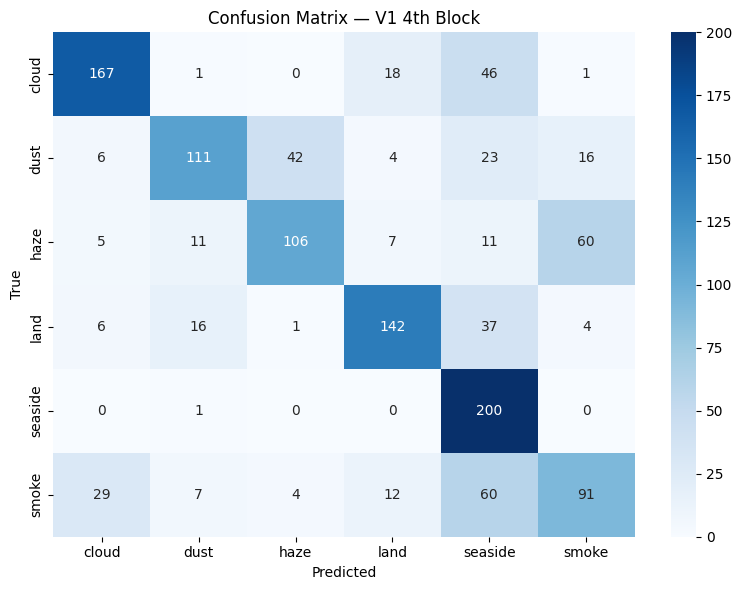

In [37]:
cm_v1 = confusion_matrix(y_val, y_pred_v1)
fig, ax = plt.subplots(figsize=(8, 6))
sns.heatmap(cm_v1, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_names, yticklabels=class_names, ax=ax)
ax.set_xlabel('Predicted')
ax.set_ylabel('True')
ax.set_title('Confusion Matrix — V1 4th Block')
plt.tight_layout()
plt.show()

In [35]:
# ╔══════════════════════════════════════════════════════════════════╗
# ║  ⚠  LOAD CELL — REMOVE THIS CELL BEFORE HAND-IN               ║
# ║  In development: comment out the training cell above and        ║
# ║  run this cell instead to skip re-training.                     ║
# ╚══════════════════════════════════════════════════════════════════╝
cnn_v1 = tf.keras.models.load_model("tuned_models/cnn_v1_model.h5", compile=False)
print("Model loaded: cnn_v1_model.h5")

Model loaded: cnn_v1_model.h5


### V2 — Two-Layer Head

In [38]:
def build_cnn_v2(input_shape=(224, 224, 3), num_classes=6):
    inputs = tf.keras.Input(shape=input_shape)

    x = tf.keras.layers.Conv2D(32, 3, padding='same')(inputs)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.ReLU()(x)
    x = tf.keras.layers.Conv2D(32, 3, padding='same')(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.ReLU()(x)
    x = tf.keras.layers.MaxPool2D(2)(x)
    x = tf.keras.layers.Dropout(0.25)(x)

    x = tf.keras.layers.Conv2D(64, 3, padding='same')(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.ReLU()(x)
    x = tf.keras.layers.Conv2D(64, 3, padding='same')(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.ReLU()(x)
    x = tf.keras.layers.MaxPool2D(2)(x)
    x = tf.keras.layers.Dropout(0.25)(x)

    x = tf.keras.layers.Conv2D(128, 3, padding='same')(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.ReLU()(x)
    x = tf.keras.layers.Conv2D(128, 3, padding='same')(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.ReLU()(x)
    x = tf.keras.layers.MaxPool2D(2)(x)
    x = tf.keras.layers.Dropout(0.25)(x)

    # Two-layer dense head
    x = tf.keras.layers.GlobalAveragePooling2D()(x)
    x = tf.keras.layers.Dense(512)(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.ReLU()(x)
    x = tf.keras.layers.Dropout(0.4)(x)
    x = tf.keras.layers.Dense(256)(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.ReLU()(x)
    x = tf.keras.layers.Dropout(0.5)(x)
    outputs = tf.keras.layers.Dense(num_classes, activation='softmax')(x)

    return tf.keras.Model(inputs, outputs)

cnn_v2 = build_cnn_v2()
cnn_v2.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 conv2d_8 (Conv2D)           (None, 224, 224, 32)      896       
                                                                 
 batch_normalization_9 (Batc  (None, 224, 224, 32)     128       
 hNormalization)                                                 
                                                                 
 re_lu_9 (ReLU)              (None, 224, 224, 32)      0         
                                                                 
 conv2d_9 (Conv2D)           (None, 224, 224, 32)      9248      
                                                                 
 batch_normalization_10 (Bat  (None, 224, 224, 32)     128       
 chNormalization)                                          

In [39]:
cnn_v2.compile(
    optimizer=tf.keras.optimizers.experimental.AdamW(learning_rate=1e-3),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

In [60]:
callbacks_v2 = [
    tf.keras.callbacks.EarlyStopping(patience=7, restore_best_weights=True, monitor='val_accuracy'),
    tf.keras.callbacks.ReduceLROnPlateau(patience=3, factor=0.5, monitor='val_loss', verbose=1),
    tf.keras.callbacks.ModelCheckpoint('cnn_v2_best.h5', save_best_only=True, monitor='val_accuracy', verbose=1),
]

t_start = time.time()
history_v2 = cnn_v2.fit(
    train_ds,
    validation_data=val_ds,
    epochs=50,
    callbacks=callbacks_v2
)
cnn_v2_train_time = time.time() - t_start
print(f"\nTraining time: {cnn_v2_train_time:.0f}s  ({cnn_v2_train_time/60:.1f} min)")

Epoch 1/50
117/117 [==============================] - ETA: 0s - loss: 1.5410 - accuracy: 0.4498
Epoch 1: val_accuracy improved from -inf to 0.16064, saving model to cnn_v2_best.h5
117/117 [==============================] - 20s 123ms/step - loss: 1.5410 - accuracy: 0.4498 - val_loss: 2.9362 - val_accuracy: 0.1606 - lr: 0.0010
Epoch 2/50
117/117 [==============================] - ETA: 0s - loss: 1.2168 - accuracy: 0.5572
Epoch 2: val_accuracy improved from 0.16064 to 0.22008, saving model to cnn_v2_best.h5
117/117 [==============================] - 14s 118ms/step - loss: 1.2168 - accuracy: 0.5572 - val_loss: 3.7095 - val_accuracy: 0.2201 - lr: 0.0010
Epoch 3/50
117/117 [==============================] - ETA: 0s - loss: 1.0890 - accuracy: 0.5925
Epoch 3: val_accuracy improved from 0.22008 to 0.37189, saving model to cnn_v2_best.h5
117/117 [==============================] - 14s 118ms/step - loss: 1.0890 - accuracy: 0.5925 - val_loss: 2.3477 - val_accuracy: 0.3719 - lr: 0.0010
Epoch 4/50
11

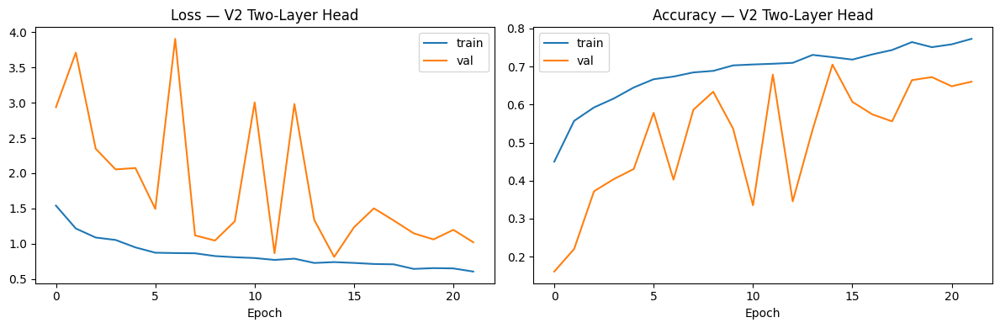

In [61]:
fig, axes = plt.subplots(1, 2, figsize=(12, 4))

axes[0].plot(history_v2.history['loss'], label='train')
axes[0].plot(history_v2.history['val_loss'], label='val')
axes[0].set_title('Loss — V2 Two-Layer Head')
axes[0].set_xlabel('Epoch')
axes[0].legend()

axes[1].plot(history_v2.history['accuracy'], label='train')
axes[1].plot(history_v2.history['val_accuracy'], label='val')
axes[1].set_title('Accuracy — V2 Two-Layer Head')
axes[1].set_xlabel('Epoch')
axes[1].legend()

plt.tight_layout()
plt.show()

In [41]:
y_pred_v2 = np.argmax(cnn_v2.predict(X_val_norm), axis=1)
print(classification_report(y_val, y_pred_v2, target_names=class_names))

39/39 [==============================] - 1s 25ms/step
              precision    recall  f1-score   support

       cloud       0.72      0.90      0.80       233
        dust       0.76      0.66      0.70       202
        haze       0.83      0.49      0.62       200
        land       0.67      0.78      0.72       206
     seaside       0.71      0.97      0.82       201
       smoke       0.57      0.40      0.47       203

    accuracy                           0.71      1245
   macro avg       0.71      0.70      0.69      1245
weighted avg       0.71      0.71      0.69      1245



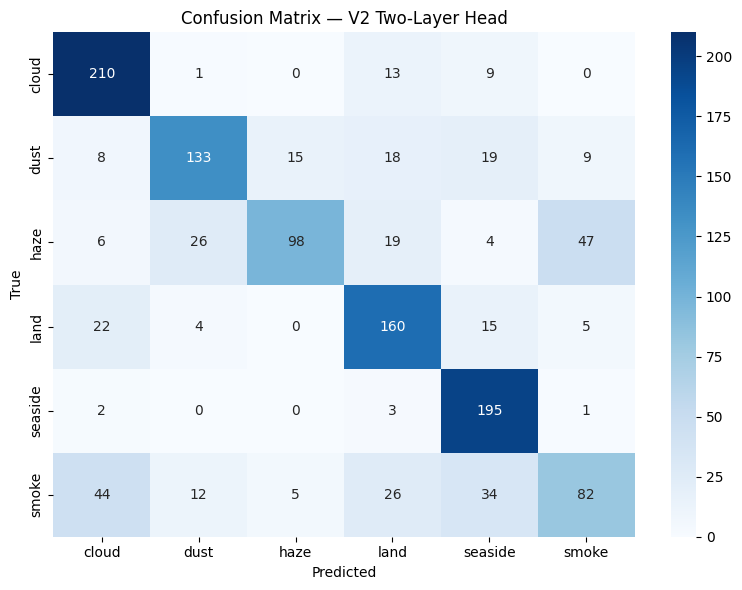

In [42]:
cm_v2 = confusion_matrix(y_val, y_pred_v2)
fig, ax = plt.subplots(figsize=(8, 6))
sns.heatmap(cm_v2, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_names, yticklabels=class_names, ax=ax)
ax.set_xlabel('Predicted')
ax.set_ylabel('True')
ax.set_title('Confusion Matrix — V2 Two-Layer Head')
plt.tight_layout()
plt.show()

In [40]:
# ╔══════════════════════════════════════════════════════════════════╗
# ║  ⚠  LOAD CELL — REMOVE THIS CELL BEFORE HAND-IN               ║
# ║  In development: comment out the training cell above and        ║
# ║  run this cell instead to skip re-training.                     ║
# ╚══════════════════════════════════════════════════════════════════╝
cnn_v2 = tf.keras.models.load_model("tuned_models/cnn_v2_model.h5", compile=False)
print("Model loaded: cnn_v2_model.h5")

Model loaded: cnn_v2_model.h5


### V3 — Wide Dense

In [43]:
def build_cnn_v3(input_shape=(224, 224, 3), num_classes=6):
    inputs = tf.keras.Input(shape=input_shape)

    x = tf.keras.layers.Conv2D(32, 3, padding='same')(inputs)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.ReLU()(x)
    x = tf.keras.layers.Conv2D(32, 3, padding='same')(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.ReLU()(x)
    x = tf.keras.layers.MaxPool2D(2)(x)
    x = tf.keras.layers.Dropout(0.25)(x)

    x = tf.keras.layers.Conv2D(64, 3, padding='same')(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.ReLU()(x)
    x = tf.keras.layers.Conv2D(64, 3, padding='same')(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.ReLU()(x)
    x = tf.keras.layers.MaxPool2D(2)(x)
    x = tf.keras.layers.Dropout(0.25)(x)

    x = tf.keras.layers.Conv2D(128, 3, padding='same')(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.ReLU()(x)
    x = tf.keras.layers.Conv2D(128, 3, padding='same')(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.ReLU()(x)
    x = tf.keras.layers.MaxPool2D(2)(x)
    x = tf.keras.layers.Dropout(0.25)(x)

    # Dense head — single wide layer
    x = tf.keras.layers.GlobalAveragePooling2D()(x)
    x = tf.keras.layers.Dense(1024)(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.ReLU()(x)
    x = tf.keras.layers.Dropout(0.5)(x)
    outputs = tf.keras.layers.Dense(num_classes, activation='softmax')(x)

    return tf.keras.Model(inputs, outputs)

cnn_v3 = build_cnn_v3()
cnn_v3.summary()

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 conv2d_14 (Conv2D)          (None, 224, 224, 32)      896       
                                                                 
 batch_normalization_17 (Bat  (None, 224, 224, 32)     128       
 chNormalization)                                                
                                                                 
 re_lu_17 (ReLU)             (None, 224, 224, 32)      0         
                                                                 
 conv2d_15 (Conv2D)          (None, 224, 224, 32)      9248      
                                                                 
 batch_normalization_18 (Bat  (None, 224, 224, 32)     128       
 chNormalization)                                          

In [44]:
cnn_v3.compile(
    optimizer=tf.keras.optimizers.experimental.AdamW(learning_rate=1e-3),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

In [68]:
callbacks_v3 = [
    tf.keras.callbacks.EarlyStopping(patience=7, restore_best_weights=True, monitor='val_accuracy'),
    tf.keras.callbacks.ReduceLROnPlateau(patience=3, factor=0.5, monitor='val_loss', verbose=1),
    tf.keras.callbacks.ModelCheckpoint('cnn_v3_best.h5', save_best_only=True, monitor='val_accuracy', verbose=1),
]

t_start = time.time()
history_v3 = cnn_v3.fit(
    train_ds,
    validation_data=val_ds,
    epochs=50,
    callbacks=callbacks_v3
)
cnn_v3_train_time = time.time() - t_start
print(f"\nTraining time: {cnn_v3_train_time:.0f}s  ({cnn_v3_train_time/60:.1f} min)")

Epoch 1/50
117/117 [==============================] - ETA: 0s - loss: 1.3971 - accuracy: 0.5041
Epoch 1: val_accuracy improved from -inf to 0.15582, saving model to cnn_v3_best.h5
117/117 [==============================] - 19s 121ms/step - loss: 1.3971 - accuracy: 0.5041 - val_loss: 3.2923 - val_accuracy: 0.1558 - lr: 0.0010
Epoch 2/50
117/117 [==============================] - ETA: 0s - loss: 1.1729 - accuracy: 0.5743
Epoch 2: val_accuracy improved from 0.15582 to 0.16466, saving model to cnn_v3_best.h5
117/117 [==============================] - 14s 115ms/step - loss: 1.1729 - accuracy: 0.5743 - val_loss: 4.9649 - val_accuracy: 0.1647 - lr: 0.0010
Epoch 3/50
117/117 [==============================] - ETA: 0s - loss: 1.1330 - accuracy: 0.5952
Epoch 3: val_accuracy improved from 0.16466 to 0.36305, saving model to cnn_v3_best.h5
117/117 [==============================] - 14s 114ms/step - loss: 1.1330 - accuracy: 0.5952 - val_loss: 2.9550 - val_accuracy: 0.3631 - lr: 0.0010
Epoch 4/50
11

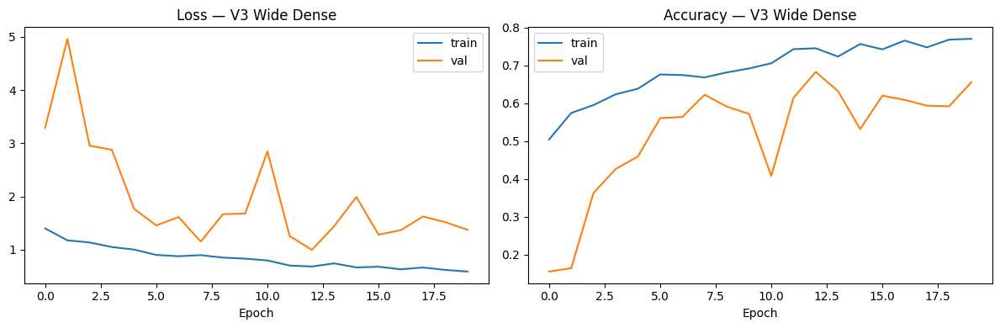

In [69]:
fig, axes = plt.subplots(1, 2, figsize=(12, 4))

axes[0].plot(history_v3.history['loss'], label='train')
axes[0].plot(history_v3.history['val_loss'], label='val')
axes[0].set_title('Loss — V3 Wide Dense')
axes[0].set_xlabel('Epoch')
axes[0].legend()

axes[1].plot(history_v3.history['accuracy'], label='train')
axes[1].plot(history_v3.history['val_accuracy'], label='val')
axes[1].set_title('Accuracy — V3 Wide Dense')
axes[1].set_xlabel('Epoch')
axes[1].legend()

plt.tight_layout()
plt.show()

In [46]:
y_pred_v3 = np.argmax(cnn_v3.predict(X_val_norm), axis=1)
print(classification_report(y_val, y_pred_v3, target_names=class_names))

39/39 [==============================] - 1s 25ms/step
              precision    recall  f1-score   support

       cloud       0.75      0.82      0.78       233
        dust       0.64      0.76      0.70       202
        haze       0.83      0.47      0.60       200
        land       0.76      0.68      0.72       206
     seaside       0.63      0.99      0.77       201
       smoke       0.54      0.35      0.43       203

    accuracy                           0.68      1245
   macro avg       0.69      0.68      0.67      1245
weighted avg       0.69      0.68      0.67      1245



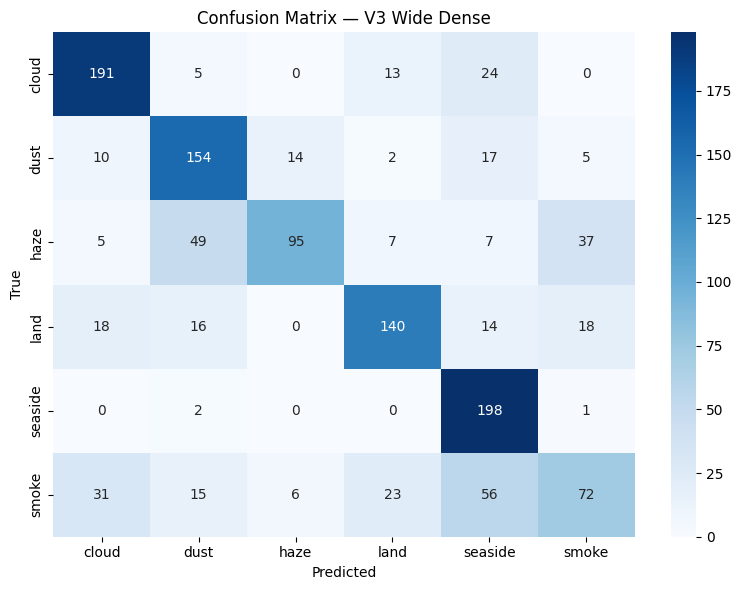

In [47]:
cm_v3 = confusion_matrix(y_val, y_pred_v3)
fig, ax = plt.subplots(figsize=(8, 6))
sns.heatmap(cm_v3, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_names, yticklabels=class_names, ax=ax)
ax.set_xlabel('Predicted')
ax.set_ylabel('True')
ax.set_title('Confusion Matrix — V3 Wide Dense')
plt.tight_layout()
plt.show()

In [45]:
# ╔══════════════════════════════════════════════════════════════════╗
# ║  ⚠  LOAD CELL — REMOVE THIS CELL BEFORE HAND-IN               ║
# ║  In development: comment out the training cell above and        ║
# ║  run this cell instead to skip re-training.                     ║
# ╚══════════════════════════════════════════════════════════════════╝
cnn_v3 = tf.keras.models.load_model("tuned_models/cnn_v3_model.h5", compile=False)
print("Model loaded: cnn_v3_model.h5")

Model loaded: cnn_v3_model.h5


### V4 — Half-Width

In [48]:
def build_cnn_v4(input_shape=(224, 224, 3), num_classes=6):
    inputs = tf.keras.Input(shape=input_shape)

    x = tf.keras.layers.Conv2D(16, 3, padding='same')(inputs)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.ReLU()(x)
    x = tf.keras.layers.Conv2D(16, 3, padding='same')(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.ReLU()(x)
    x = tf.keras.layers.MaxPool2D(2)(x)
    x = tf.keras.layers.Dropout(0.25)(x)

    x = tf.keras.layers.Conv2D(32, 3, padding='same')(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.ReLU()(x)
    x = tf.keras.layers.Conv2D(32, 3, padding='same')(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.ReLU()(x)
    x = tf.keras.layers.MaxPool2D(2)(x)
    x = tf.keras.layers.Dropout(0.25)(x)

    x = tf.keras.layers.Conv2D(64, 3, padding='same')(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.ReLU()(x)
    x = tf.keras.layers.Conv2D(64, 3, padding='same')(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.ReLU()(x)
    x = tf.keras.layers.MaxPool2D(2)(x)
    x = tf.keras.layers.Dropout(0.25)(x)

    # Dense head
    x = tf.keras.layers.GlobalAveragePooling2D()(x)
    x = tf.keras.layers.Dense(256)(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.ReLU()(x)
    x = tf.keras.layers.Dropout(0.5)(x)
    outputs = tf.keras.layers.Dense(num_classes, activation='softmax')(x)

    return tf.keras.Model(inputs, outputs)

cnn_v4 = build_cnn_v4()
cnn_v4.summary()

Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 conv2d_20 (Conv2D)          (None, 224, 224, 16)      448       
                                                                 
 batch_normalization_24 (Bat  (None, 224, 224, 16)     64        
 chNormalization)                                                
                                                                 
 re_lu_24 (ReLU)             (None, 224, 224, 16)      0         
                                                                 
 conv2d_21 (Conv2D)          (None, 224, 224, 16)      2320      
                                                                 
 batch_normalization_25 (Bat  (None, 224, 224, 16)     64        
 chNormalization)                                          

In [49]:
cnn_v4.compile(
    optimizer=tf.keras.optimizers.experimental.AdamW(learning_rate=1e-3),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

In [76]:
callbacks_v4 = [
    tf.keras.callbacks.EarlyStopping(patience=7, restore_best_weights=True, monitor='val_accuracy'),
    tf.keras.callbacks.ReduceLROnPlateau(patience=3, factor=0.5, monitor='val_loss', verbose=1),
    tf.keras.callbacks.ModelCheckpoint('cnn_v4_best.h5', save_best_only=True, monitor='val_accuracy', verbose=1),
]

t_start = time.time()
history_v4 = cnn_v4.fit(
    train_ds,
    validation_data=val_ds,
    epochs=50,
    callbacks=callbacks_v4
)
cnn_v4_train_time = time.time() - t_start
print(f"\nTraining time: {cnn_v4_train_time:.0f}s  ({cnn_v4_train_time/60:.1f} min)")

Epoch 1/50
117/117 [==============================] - ETA: 0s - loss: 1.4745 - accuracy: 0.4616
Epoch 1: val_accuracy improved from -inf to 0.16386, saving model to cnn_v4_best.h5
117/117 [==============================] - 13s 69ms/step - loss: 1.4745 - accuracy: 0.4616 - val_loss: 1.8821 - val_accuracy: 0.1639 - lr: 0.0010
Epoch 2/50
116/117 [============================>.] - ETA: 0s - loss: 1.1768 - accuracy: 0.5582
Epoch 2: val_accuracy improved from 0.16386 to 0.19277, saving model to cnn_v4_best.h5
117/117 [==============================] - 8s 63ms/step - loss: 1.1746 - accuracy: 0.5585 - val_loss: 2.1123 - val_accuracy: 0.1928 - lr: 0.0010
Epoch 3/50
116/117 [============================>.] - ETA: 0s - loss: 1.1101 - accuracy: 0.5935
Epoch 3: val_accuracy improved from 0.19277 to 0.29398, saving model to cnn_v4_best.h5
117/117 [==============================] - 8s 63ms/step - loss: 1.1110 - accuracy: 0.5936 - val_loss: 2.6670 - val_accuracy: 0.2940 - lr: 0.0010
Epoch 4/50
116/117

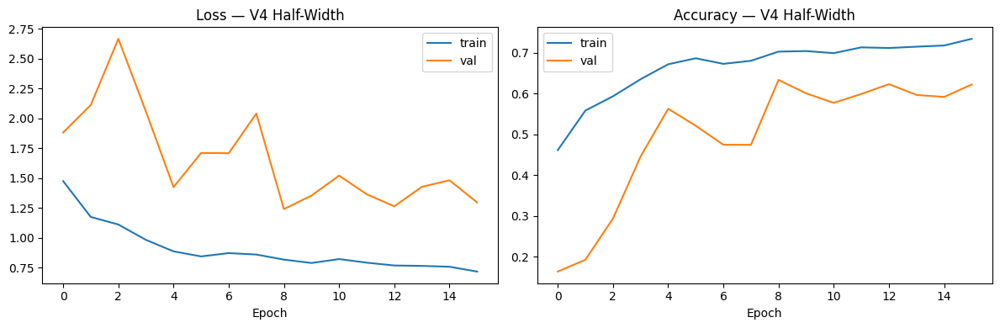

In [77]:
fig, axes = plt.subplots(1, 2, figsize=(12, 4))

axes[0].plot(history_v4.history['loss'], label='train')
axes[0].plot(history_v4.history['val_loss'], label='val')
axes[0].set_title('Loss — V4 Half-Width')
axes[0].set_xlabel('Epoch')
axes[0].legend()

axes[1].plot(history_v4.history['accuracy'], label='train')
axes[1].plot(history_v4.history['val_accuracy'], label='val')
axes[1].set_title('Accuracy — V4 Half-Width')
axes[1].set_xlabel('Epoch')
axes[1].legend()

plt.tight_layout()
plt.show()

In [51]:
y_pred_v4 = np.argmax(cnn_v4.predict(X_val_norm), axis=1)
print(classification_report(y_val, y_pred_v4, target_names=class_names))

39/39 [==============================] - 1s 14ms/step
              precision    recall  f1-score   support

       cloud       0.79      0.79      0.79       233
        dust       0.62      0.77      0.68       202
        haze       0.82      0.35      0.49       200
        land       0.78      0.66      0.71       206
     seaside       0.49      0.99      0.66       201
       smoke       0.48      0.23      0.31       203

    accuracy                           0.63      1245
   macro avg       0.66      0.63      0.61      1245
weighted avg       0.66      0.63      0.61      1245



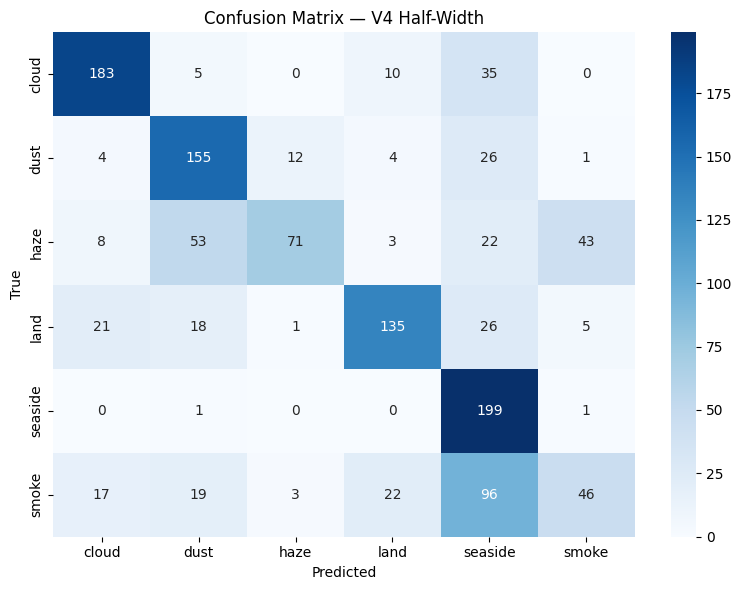

In [52]:
cm_v4 = confusion_matrix(y_val, y_pred_v4)
fig, ax = plt.subplots(figsize=(8, 6))
sns.heatmap(cm_v4, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_names, yticklabels=class_names, ax=ax)
ax.set_xlabel('Predicted')
ax.set_ylabel('True')
ax.set_title('Confusion Matrix — V4 Half-Width')
plt.tight_layout()
plt.show()

In [50]:
# ╔══════════════════════════════════════════════════════════════════╗
# ║  ⚠  LOAD CELL — REMOVE THIS CELL BEFORE HAND-IN               ║
# ║  In development: comment out the training cell above and        ║
# ║  run this cell instead to skip re-training.                     ║
# ╚══════════════════════════════════════════════════════════════════╝
cnn_v4 = tf.keras.models.load_model("tuned_models/cnn_v4_model.h5", compile=False)
print("Model loaded: cnn_v4_model.h5")

Model loaded: cnn_v4_model.h5


### V5 — Double-Width

In [53]:
def build_cnn_v5(input_shape=(224, 224, 3), num_classes=6):
    inputs = tf.keras.Input(shape=input_shape)

    x = tf.keras.layers.Conv2D(64, 3, padding='same')(inputs)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.ReLU()(x)
    x = tf.keras.layers.Conv2D(64, 3, padding='same')(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.ReLU()(x)
    x = tf.keras.layers.MaxPool2D(2)(x)
    x = tf.keras.layers.Dropout(0.25)(x)

    x = tf.keras.layers.Conv2D(128, 3, padding='same')(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.ReLU()(x)
    x = tf.keras.layers.Conv2D(128, 3, padding='same')(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.ReLU()(x)
    x = tf.keras.layers.MaxPool2D(2)(x)
    x = tf.keras.layers.Dropout(0.25)(x)

    x = tf.keras.layers.Conv2D(256, 3, padding='same')(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.ReLU()(x)
    x = tf.keras.layers.Conv2D(256, 3, padding='same')(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.ReLU()(x)
    x = tf.keras.layers.MaxPool2D(2)(x)
    x = tf.keras.layers.Dropout(0.25)(x)

    # Dense head
    x = tf.keras.layers.GlobalAveragePooling2D()(x)
    x = tf.keras.layers.Dense(256)(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.ReLU()(x)
    x = tf.keras.layers.Dropout(0.5)(x)
    outputs = tf.keras.layers.Dense(num_classes, activation='softmax')(x)

    return tf.keras.Model(inputs, outputs)

cnn_v5 = build_cnn_v5()
cnn_v5.summary()

Model: "model_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_5 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 conv2d_26 (Conv2D)          (None, 224, 224, 64)      1792      
                                                                 
 batch_normalization_31 (Bat  (None, 224, 224, 64)     256       
 chNormalization)                                                
                                                                 
 re_lu_31 (ReLU)             (None, 224, 224, 64)      0         
                                                                 
 conv2d_27 (Conv2D)          (None, 224, 224, 64)      36928     
                                                                 
 batch_normalization_32 (Bat  (None, 224, 224, 64)     256       
 chNormalization)                                          

In [54]:
cnn_v5.compile(
    optimizer=tf.keras.optimizers.experimental.AdamW(learning_rate=1e-3),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

In [84]:
callbacks_v5 = [
    tf.keras.callbacks.EarlyStopping(patience=7, restore_best_weights=True, monitor='val_accuracy'),
    tf.keras.callbacks.ReduceLROnPlateau(patience=3, factor=0.5, monitor='val_loss', verbose=1),
    tf.keras.callbacks.ModelCheckpoint('cnn_v5_best.h5', save_best_only=True, monitor='val_accuracy', verbose=1),
]

t_start = time.time()
history_v5 = cnn_v5.fit(
    train_ds,
    validation_data=val_ds,
    epochs=50,
    callbacks=callbacks_v5
)
cnn_v5_train_time = time.time() - t_start
print(f"\nTraining time: {cnn_v5_train_time:.0f}s  ({cnn_v5_train_time/60:.1f} min)")

Epoch 1/50
117/117 [==============================] - ETA: 0s - loss: 1.4215 - accuracy: 0.4924
Epoch 1: val_accuracy improved from -inf to 0.16225, saving model to cnn_v5_best.h5
117/117 [==============================] - 52s 333ms/step - loss: 1.4215 - accuracy: 0.4924 - val_loss: 3.8619 - val_accuracy: 0.1622 - lr: 0.0010
Epoch 2/50
117/117 [==============================] - ETA: 0s - loss: 1.1729 - accuracy: 0.5564
Epoch 2: val_accuracy did not improve from 0.16225
117/117 [==============================] - 32s 273ms/step - loss: 1.1729 - accuracy: 0.5564 - val_loss: 4.7712 - val_accuracy: 0.1622 - lr: 0.0010
Epoch 3/50
117/117 [==============================] - ETA: 0s - loss: 1.0600 - accuracy: 0.6115
Epoch 3: val_accuracy improved from 0.16225 to 0.29317, saving model to cnn_v5_best.h5
117/117 [==============================] - 32s 270ms/step - loss: 1.0600 - accuracy: 0.6115 - val_loss: 2.7330 - val_accuracy: 0.2932 - lr: 0.0010
Epoch 4/50
117/117 [=============================

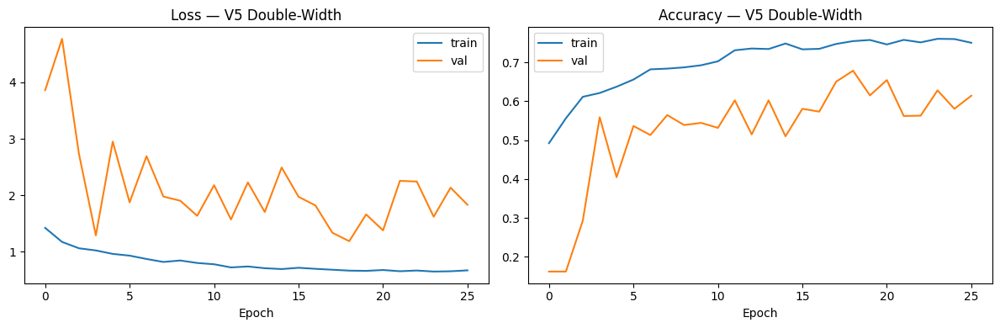

In [85]:
fig, axes = plt.subplots(1, 2, figsize=(12, 4))

axes[0].plot(history_v5.history['loss'], label='train')
axes[0].plot(history_v5.history['val_loss'], label='val')
axes[0].set_title('Loss — V5 Double-Width')
axes[0].set_xlabel('Epoch')
axes[0].legend()

axes[1].plot(history_v5.history['accuracy'], label='train')
axes[1].plot(history_v5.history['val_accuracy'], label='val')
axes[1].set_title('Accuracy — V5 Double-Width')
axes[1].set_xlabel('Epoch')
axes[1].legend()

plt.tight_layout()
plt.show()

In [56]:
y_pred_v5 = np.argmax(cnn_v5.predict(X_val_norm), axis=1)
print(classification_report(y_val, y_pred_v5, target_names=class_names))

39/39 [==============================] - 3s 57ms/step
              precision    recall  f1-score   support

       cloud       0.82      0.85      0.83       233
        dust       0.72      0.71      0.72       202
        haze       0.80      0.57      0.67       200
        land       0.79      0.66      0.72       206
     seaside       0.52      0.99      0.69       201
       smoke       0.50      0.27      0.35       203

    accuracy                           0.68      1245
   macro avg       0.69      0.67      0.66      1245
weighted avg       0.70      0.68      0.67      1245



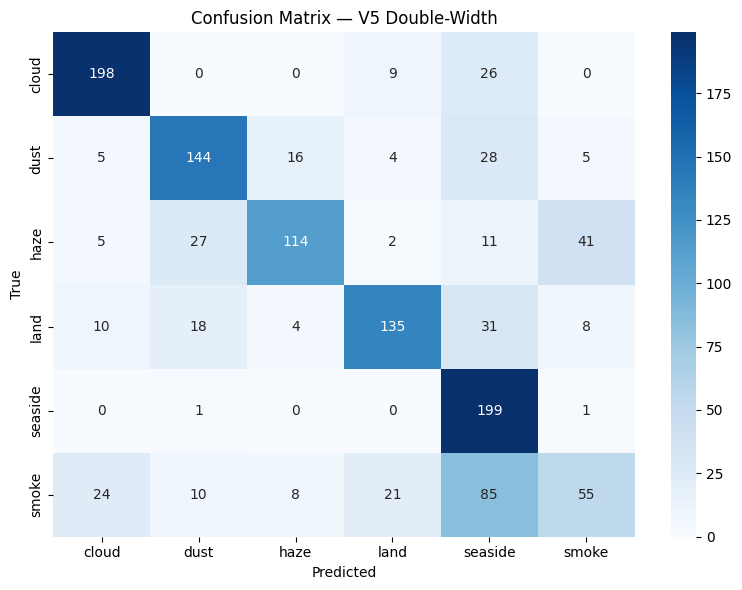

In [57]:
cm_v5 = confusion_matrix(y_val, y_pred_v5)
fig, ax = plt.subplots(figsize=(8, 6))
sns.heatmap(cm_v5, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_names, yticklabels=class_names, ax=ax)
ax.set_xlabel('Predicted')
ax.set_ylabel('True')
ax.set_title('Confusion Matrix — V5 Double-Width')
plt.tight_layout()
plt.show()

In [55]:
# ╔══════════════════════════════════════════════════════════════════╗
# ║  ⚠  LOAD CELL — REMOVE THIS CELL BEFORE HAND-IN               ║
# ║  In development: comment out the training cell above and        ║
# ║  run this cell instead to skip re-training.                     ║
# ╚══════════════════════════════════════════════════════════════════╝
cnn_v5 = tf.keras.models.load_model("tuned_models/cnn_v5_model.h5", compile=False)
print("Model loaded: cnn_v5_model.h5")

Model loaded: cnn_v5_model.h5


### V6 — 4 Blocks + Two-Layer Head

In [58]:
def build_cnn_v6(input_shape=(224, 224, 3), num_classes=6):
    inputs = tf.keras.Input(shape=input_shape)

    x = tf.keras.layers.Conv2D(32, 3, padding='same')(inputs)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.ReLU()(x)
    x = tf.keras.layers.Conv2D(32, 3, padding='same')(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.ReLU()(x)
    x = tf.keras.layers.MaxPool2D(2)(x)
    x = tf.keras.layers.Dropout(0.25)(x)

    x = tf.keras.layers.Conv2D(64, 3, padding='same')(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.ReLU()(x)
    x = tf.keras.layers.Conv2D(64, 3, padding='same')(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.ReLU()(x)
    x = tf.keras.layers.MaxPool2D(2)(x)
    x = tf.keras.layers.Dropout(0.25)(x)

    x = tf.keras.layers.Conv2D(128, 3, padding='same')(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.ReLU()(x)
    x = tf.keras.layers.Conv2D(128, 3, padding='same')(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.ReLU()(x)
    x = tf.keras.layers.MaxPool2D(2)(x)
    x = tf.keras.layers.Dropout(0.25)(x)

    x = tf.keras.layers.Conv2D(256, 3, padding='same')(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.ReLU()(x)
    x = tf.keras.layers.Conv2D(256, 3, padding='same')(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.ReLU()(x)
    x = tf.keras.layers.MaxPool2D(2)(x)
    x = tf.keras.layers.Dropout(0.25)(x)

    # Two-layer dense head
    x = tf.keras.layers.GlobalAveragePooling2D()(x)
    x = tf.keras.layers.Dense(512)(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.ReLU()(x)
    x = tf.keras.layers.Dropout(0.4)(x)
    x = tf.keras.layers.Dense(256)(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.ReLU()(x)
    x = tf.keras.layers.Dropout(0.5)(x)
    outputs = tf.keras.layers.Dense(num_classes, activation='softmax')(x)

    return tf.keras.Model(inputs, outputs)

cnn_v6 = build_cnn_v6()
cnn_v6.summary()

Model: "model_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_6 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 conv2d_32 (Conv2D)          (None, 224, 224, 32)      896       
                                                                 
 batch_normalization_38 (Bat  (None, 224, 224, 32)     128       
 chNormalization)                                                
                                                                 
 re_lu_38 (ReLU)             (None, 224, 224, 32)      0         
                                                                 
 conv2d_33 (Conv2D)          (None, 224, 224, 32)      9248      
                                                                 
 batch_normalization_39 (Bat  (None, 224, 224, 32)     128       
 chNormalization)                                          

In [59]:
cnn_v6.compile(
    optimizer=tf.keras.optimizers.experimental.AdamW(learning_rate=1e-3),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

In [38]:
callbacks_v6 = [
    tf.keras.callbacks.EarlyStopping(patience=7, restore_best_weights=True, monitor='val_accuracy'),
    tf.keras.callbacks.ReduceLROnPlateau(patience=3, factor=0.5, monitor='val_loss', verbose=1),
    tf.keras.callbacks.ModelCheckpoint('cnn_v6_best.h5', save_best_only=True, monitor='val_accuracy', verbose=1),
]

t_start = time.time()
history_v6 = cnn_v6.fit(
    train_ds,
    validation_data=val_ds,
    epochs=50,
    callbacks=callbacks_v6
)
cnn_v6_train_time = time.time() - t_start
print(f"Training time: {cnn_v6_train_time:.0f}s  ({cnn_v6_train_time/60:.1f} min)")

Epoch 1/50
117/117 [==============================] - ETA: 0s - loss: 1.5479 - accuracy: 0.4594
Epoch 1: val_accuracy improved from -inf to 0.17108, saving model to cnn_v6_best.h5
117/117 [==============================] - 48s 153ms/step - loss: 1.5479 - accuracy: 0.4594 - val_loss: 3.7651 - val_accuracy: 0.1711 - lr: 0.0010
Epoch 2/50
117/117 [==============================] - ETA: 0s - loss: 1.3160 - accuracy: 0.5269
Epoch 2: val_accuracy did not improve from 0.17108
117/117 [==============================] - 16s 135ms/step - loss: 1.3160 - accuracy: 0.5269 - val_loss: 5.4536 - val_accuracy: 0.1655 - lr: 0.0010
Epoch 3/50
117/117 [==============================] - ETA: 0s - loss: 1.1178 - accuracy: 0.5863
Epoch 3: val_accuracy improved from 0.17108 to 0.34538, saving model to cnn_v6_best.h5
117/117 [==============================] - 16s 135ms/step - loss: 1.1178 - accuracy: 0.5863 - val_loss: 2.3446 - val_accuracy: 0.3454 - lr: 0.0010
Epoch 4/50
117/117 [=============================

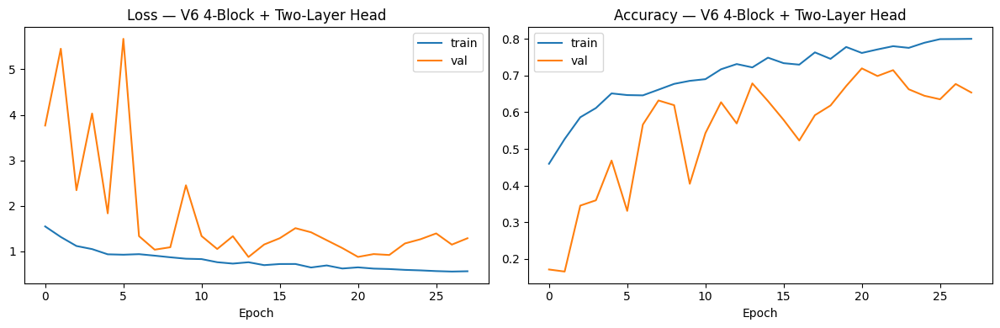

In [39]:
fig, axes = plt.subplots(1, 2, figsize=(12, 4))

axes[0].plot(history_v6.history['loss'], label='train')
axes[0].plot(history_v6.history['val_loss'], label='val')
axes[0].set_title('Loss — V6 4-Block + Two-Layer Head')
axes[0].set_xlabel('Epoch')
axes[0].legend()

axes[1].plot(history_v6.history['accuracy'], label='train')
axes[1].plot(history_v6.history['val_accuracy'], label='val')
axes[1].set_title('Accuracy — V6 4-Block + Two-Layer Head')
axes[1].set_xlabel('Epoch')
axes[1].legend()

plt.tight_layout()
plt.show()

In [61]:
y_pred_v6 = np.argmax(cnn_v6.predict(X_val_norm), axis=1)
print(classification_report(y_val, y_pred_v6, target_names=class_names))

39/39 [==============================] - 2s 28ms/step
              precision    recall  f1-score   support

       cloud       0.65      0.94      0.77       233
        dust       0.69      0.77      0.73       202
        haze       0.79      0.56      0.65       200
        land       0.85      0.69      0.76       206
     seaside       0.75      0.98      0.85       201
       smoke       0.65      0.34      0.45       203

    accuracy                           0.72      1245
   macro avg       0.73      0.71      0.70      1245
weighted avg       0.73      0.72      0.70      1245



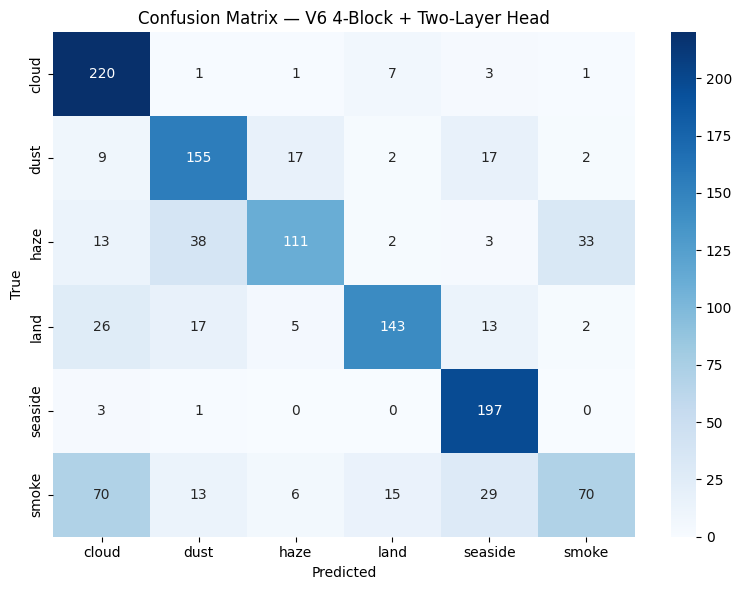

In [62]:
cm_v6 = confusion_matrix(y_val, y_pred_v6)
fig, ax = plt.subplots(figsize=(8, 6))
sns.heatmap(cm_v6, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_names, yticklabels=class_names, ax=ax)
ax.set_xlabel('Predicted')
ax.set_ylabel('True')
ax.set_title('Confusion Matrix — V6 4-Block + Two-Layer Head')
plt.tight_layout()
plt.show()

In [60]:
# ╔══════════════════════════════════════════════════════════════════╗
# ║  ⚠  LOAD CELL — REMOVE THIS CELL BEFORE HAND-IN               ║
# ║  In development: comment out the training cell above and        ║
# ║  run this cell instead to skip re-training.                     ║
# ╚══════════════════════════════════════════════════════════════════╝
cnn_v6 = tf.keras.models.load_model("tuned_models/cnn_v6_model.h5", compile=False)
print("Model loaded: cnn_v6_model.h5")

Model loaded: cnn_v6_model.h5


## V7 — Class Weights + Label Smoothing + LR Warmup/Cosine Decay

Same architecture as V6 (4 conv blocks + two-layer dense head), but with three training improvements:
- **Class weights**: penalises smoke mistakes more, discourages over-predicting seaside
- **Label smoothing (0.1)**: stops the model being overconfident on easy classes
- **LR warmup + cosine decay**: fixes the exploding validation loss in early epochs

In [63]:
from sklearn.utils.class_weight import compute_class_weight

weights = compute_class_weight('balanced', classes=np.unique(y_train), y=y_train)
class_weight_v7 = dict(enumerate(weights))

print("Class weights:")
for idx, name in enumerate(class_names):
    print(f"  {name:<10}: {class_weight_v7[idx]:.3f}")

Class weights:
  cloud     : 0.892
  dust      : 1.029
  haze      : 1.034
  land      : 1.011
  seaside   : 1.031
  smoke     : 1.020


In [64]:
def build_cnn_v7(input_shape=(224, 224, 3), num_classes=6):
    inputs = tf.keras.Input(shape=input_shape)

    x = tf.keras.layers.Conv2D(32, 3, padding='same')(inputs)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.ReLU()(x)
    x = tf.keras.layers.Conv2D(32, 3, padding='same')(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.ReLU()(x)
    x = tf.keras.layers.MaxPool2D(2)(x)
    x = tf.keras.layers.Dropout(0.25)(x)

    x = tf.keras.layers.Conv2D(64, 3, padding='same')(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.ReLU()(x)
    x = tf.keras.layers.Conv2D(64, 3, padding='same')(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.ReLU()(x)
    x = tf.keras.layers.MaxPool2D(2)(x)
    x = tf.keras.layers.Dropout(0.25)(x)

    x = tf.keras.layers.Conv2D(128, 3, padding='same')(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.ReLU()(x)
    x = tf.keras.layers.Conv2D(128, 3, padding='same')(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.ReLU()(x)
    x = tf.keras.layers.MaxPool2D(2)(x)
    x = tf.keras.layers.Dropout(0.25)(x)

    x = tf.keras.layers.Conv2D(256, 3, padding='same')(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.ReLU()(x)
    x = tf.keras.layers.Conv2D(256, 3, padding='same')(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.ReLU()(x)
    x = tf.keras.layers.MaxPool2D(2)(x)
    x = tf.keras.layers.Dropout(0.25)(x)

    # Two-layer dense head
    x = tf.keras.layers.GlobalAveragePooling2D()(x)
    x = tf.keras.layers.Dense(512)(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.ReLU()(x)
    x = tf.keras.layers.Dropout(0.4)(x)
    x = tf.keras.layers.Dense(256)(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.ReLU()(x)
    x = tf.keras.layers.Dropout(0.5)(x)
    outputs = tf.keras.layers.Dense(num_classes, activation='softmax')(x)

    return tf.keras.Model(inputs, outputs)

cnn_v7 = build_cnn_v7()
cnn_v7.summary()

Model: "model_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_7 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 conv2d_40 (Conv2D)          (None, 224, 224, 32)      896       
                                                                 
 batch_normalization_48 (Bat  (None, 224, 224, 32)     128       
 chNormalization)                                                
                                                                 
 re_lu_48 (ReLU)             (None, 224, 224, 32)      0         
                                                                 
 conv2d_41 (Conv2D)          (None, 224, 224, 32)      9248      
                                                                 
 batch_normalization_49 (Bat  (None, 224, 224, 32)     128       
 chNormalization)                                          

In [65]:
def smooth_sparse_cce(smoothing=0.1, num_classes=6):
    def loss(y_true, y_pred):
        y_true = tf.cast(tf.reshape(y_true, [-1]), tf.int32)
        y_oh   = tf.one_hot(y_true, num_classes)
        y_smooth = y_oh * (1 - smoothing) + smoothing / num_classes
        y_pred = tf.clip_by_value(y_pred, 1e-7, 1.0)
        return -tf.reduce_sum(y_smooth * tf.math.log(y_pred), axis=-1)
    return loss

cnn_v7.compile(
    optimizer=tf.keras.optimizers.experimental.AdamW(learning_rate=1e-3),
    loss=smooth_sparse_cce(smoothing=0.1, num_classes=len(class_names)),
    metrics=['accuracy']
)

In [66]:
def lr_schedule_v7(epoch, lr):
    warmup_epochs = 5
    total_epochs  = 50
    base_lr       = 1e-3
    if epoch < warmup_epochs:
        return base_lr * (epoch + 1) / warmup_epochs
    progress = (epoch - warmup_epochs) / (total_epochs - warmup_epochs)
    return base_lr * 0.5 * (1 + np.cos(np.pi * progress))

callbacks_v7 = [
    tf.keras.callbacks.EarlyStopping(patience=10, restore_best_weights=True, monitor='val_accuracy'),
    tf.keras.callbacks.LearningRateScheduler(lr_schedule_v7, verbose=1),
    tf.keras.callbacks.ModelCheckpoint('cnn_v7_best.h5', save_best_only=True, monitor='val_accuracy', verbose=1),
]

In [55]:
t_start = time.time()
history_v7 = cnn_v7.fit(
    train_ds,
    validation_data=val_ds,
    epochs=50,
    callbacks=callbacks_v7,
    class_weight=class_weight_v7
)
cnn_v7_train_time = time.time() - t_start
print(f"Training time: {cnn_v7_train_time:.0f}s  ({cnn_v7_train_time/60:.1f} min)")


Epoch 1: LearningRateScheduler setting learning rate to 0.0002.
Epoch 1/50
117/117 [==============================] - ETA: 0s - loss: 1.6995 - accuracy: 0.4324
Epoch 1: val_accuracy improved from -inf to 0.16305, saving model to cnn_v7_best.h5
117/117 [==============================] - 23s 137ms/step - loss: 1.6995 - accuracy: 0.4324 - val_loss: 1.9216 - val_accuracy: 0.1631 - lr: 2.0000e-04

Epoch 2: LearningRateScheduler setting learning rate to 0.0004.
Epoch 2/50
117/117 [==============================] - ETA: 0s - loss: 1.4383 - accuracy: 0.5339
Epoch 2: val_accuracy did not improve from 0.16305
117/117 [==============================] - 16s 132ms/step - loss: 1.4383 - accuracy: 0.5339 - val_loss: 3.3850 - val_accuracy: 0.1622 - lr: 4.0000e-04

Epoch 3: LearningRateScheduler setting learning rate to 0.0006000000000000001.
Epoch 3/50
117/117 [==============================] - ETA: 0s - loss: 1.4089 - accuracy: 0.5548
Epoch 3: val_accuracy improved from 0.16305 to 0.21687, saving mo

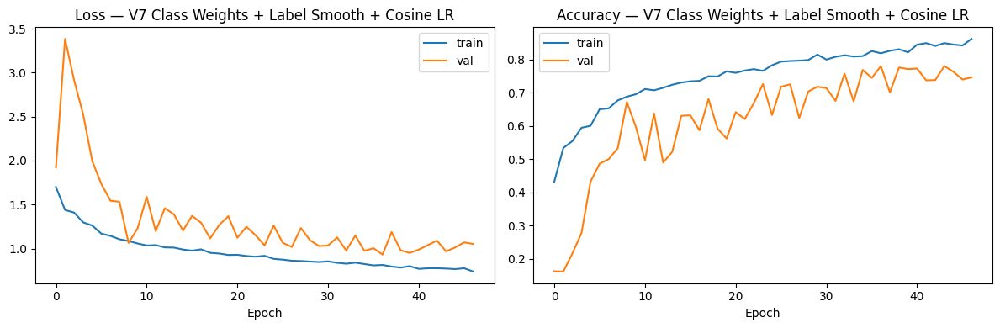

In [56]:
fig, axes = plt.subplots(1, 2, figsize=(12, 4))

axes[0].plot(history_v7.history['loss'], label='train')
axes[0].plot(history_v7.history['val_loss'], label='val')
axes[0].set_title('Loss — V7 Class Weights + Label Smooth + Cosine LR')
axes[0].set_xlabel('Epoch')
axes[0].legend()

axes[1].plot(history_v7.history['accuracy'], label='train')
axes[1].plot(history_v7.history['val_accuracy'], label='val')
axes[1].set_title('Accuracy — V7 Class Weights + Label Smooth + Cosine LR')
axes[1].set_xlabel('Epoch')
axes[1].legend()

plt.tight_layout()
plt.show()

In [68]:
y_pred_v7 = np.argmax(cnn_v7.predict(X_val_norm), axis=1)
print(classification_report(y_val, y_pred_v7, target_names=class_names))

39/39 [==============================] - 1s 28ms/step
              precision    recall  f1-score   support

       cloud       0.73      0.88      0.80       233
        dust       0.79      0.78      0.78       202
        haze       0.84      0.56      0.67       200
        land       0.77      0.86      0.81       206
     seaside       0.85      0.99      0.91       201
       smoke       0.72      0.60      0.65       203

    accuracy                           0.78      1245
   macro avg       0.78      0.78      0.77      1245
weighted avg       0.78      0.78      0.77      1245



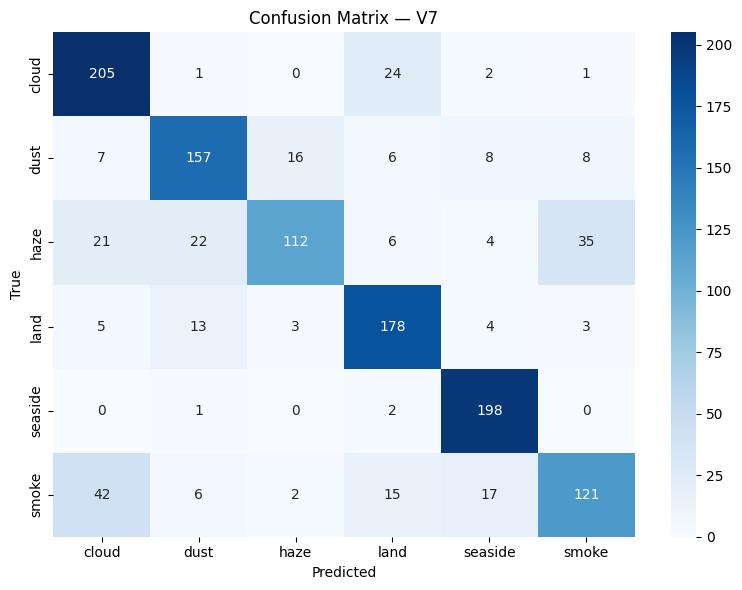

In [69]:
cm_v7 = confusion_matrix(y_val, y_pred_v7)
fig, ax = plt.subplots(figsize=(8, 6))
sns.heatmap(cm_v7, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_names, yticklabels=class_names, ax=ax)
ax.set_xlabel('Predicted')
ax.set_ylabel('True')
ax.set_title('Confusion Matrix — V7')
plt.tight_layout()
plt.show()

In [67]:
# ╔══════════════════════════════════════════════════════════════════╗
# ║  ⚠  LOAD CELL — REMOVE THIS CELL BEFORE HAND-IN               ║
# ║  In development: comment out the training cell above and        ║
# ║  run this cell instead to skip re-training.                     ║
# ╚══════════════════════════════════════════════════════════════════╝
cnn_v7 = tf.keras.models.load_model("tuned_models/cnn_v7_best.h5", compile=False)
print("Model loaded: cnn_v7_best.h5")

Model loaded: cnn_v7_best.h5


## V8 — Manual Class Weights + Extra Augmentation + More Epochs

Same architecture as V7, plus:
- **Manual class weights**: haze and smoke boosted to 2.0, seaside reduced to 0.6
- **Richer augmentation**: contrast, saturation, hue jitter added
- **100 epochs + cosine decay**: LR stays higher for longer before decaying

In [70]:
class_weight_v8 = {
    0: 1.0,
    1: 1.0,
    2: 2.0,
    3: 1.0,
    4: 0.6,
    5: 2.0,
}

print('Class weights V8:')
for idx, name in enumerate(class_names):
    print(f'  {name:<10}: {class_weight_v8[idx]:.1f}')

Class weights V8:
  cloud     : 1.0
  dust      : 1.0
  haze      : 2.0
  land      : 1.0
  seaside   : 0.6
  smoke     : 2.0


In [71]:
def augment_batch_v8(x, y):
    x = tf.image.random_flip_left_right(x)
    k = tf.random.uniform(shape=[], minval=0, maxval=4, dtype=tf.int32)
    x = tf.image.rot90(x, k)
    x = tf.image.random_brightness(x, max_delta=0.3)
    x = tf.image.random_contrast(x, 0.8, 1.2)
    x = tf.image.random_saturation(x, 0.7, 1.3)
    x = tf.image.random_hue(x, 0.05)
    x = x + tf.random.normal(shape=tf.shape(x), mean=0.0, stddev=8.0/255.0)
    x = tf.clip_by_value(x, 0.0, 1.0)
    return x, y

train_ds_v8 = (tf.data.Dataset.from_tensor_slices((X_train_norm, y_train))
               .shuffle(len(X_train_norm), seed=42)
               .batch(32)
               .map(augment_batch_v8, num_parallel_calls=tf.data.AUTOTUNE)
               .prefetch(tf.data.AUTOTUNE))

print('train_ds_v8 ready')

train_ds_v8 ready


In [72]:
def build_cnn_v8(input_shape=(224, 224, 3), num_classes=6):
    inputs = tf.keras.Input(shape=input_shape)

    x = tf.keras.layers.Conv2D(32, 3, padding='same')(inputs)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.ReLU()(x)
    x = tf.keras.layers.Conv2D(32, 3, padding='same')(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.ReLU()(x)
    x = tf.keras.layers.MaxPool2D(2)(x)
    x = tf.keras.layers.Dropout(0.25)(x)

    x = tf.keras.layers.Conv2D(64, 3, padding='same')(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.ReLU()(x)
    x = tf.keras.layers.Conv2D(64, 3, padding='same')(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.ReLU()(x)
    x = tf.keras.layers.MaxPool2D(2)(x)
    x = tf.keras.layers.Dropout(0.25)(x)

    x = tf.keras.layers.Conv2D(128, 3, padding='same')(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.ReLU()(x)
    x = tf.keras.layers.Conv2D(128, 3, padding='same')(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.ReLU()(x)
    x = tf.keras.layers.MaxPool2D(2)(x)
    x = tf.keras.layers.Dropout(0.25)(x)

    x = tf.keras.layers.Conv2D(256, 3, padding='same')(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.ReLU()(x)
    x = tf.keras.layers.Conv2D(256, 3, padding='same')(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.ReLU()(x)
    x = tf.keras.layers.MaxPool2D(2)(x)
    x = tf.keras.layers.Dropout(0.25)(x)

    x = tf.keras.layers.GlobalAveragePooling2D()(x)
    x = tf.keras.layers.Dense(512)(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.ReLU()(x)
    x = tf.keras.layers.Dropout(0.4)(x)
    x = tf.keras.layers.Dense(256)(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.ReLU()(x)
    x = tf.keras.layers.Dropout(0.5)(x)
    outputs = tf.keras.layers.Dense(num_classes, activation='softmax')(x)

    return tf.keras.Model(inputs, outputs)

cnn_v8 = build_cnn_v8()
cnn_v8.summary()

Model: "model_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_8 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 conv2d_48 (Conv2D)          (None, 224, 224, 32)      896       
                                                                 
 batch_normalization_58 (Bat  (None, 224, 224, 32)     128       
 chNormalization)                                                
                                                                 
 re_lu_58 (ReLU)             (None, 224, 224, 32)      0         
                                                                 
 conv2d_49 (Conv2D)          (None, 224, 224, 32)      9248      
                                                                 
 batch_normalization_59 (Bat  (None, 224, 224, 32)     128       
 chNormalization)                                          

In [73]:
cnn_v8.compile(
    optimizer=tf.keras.optimizers.experimental.AdamW(learning_rate=1e-3),
    loss=smooth_sparse_cce(smoothing=0.15, num_classes=len(class_names)),
    metrics=['accuracy']
)

In [74]:
def lr_schedule_v8(epoch, lr):
    warmup_epochs = 5
    total_epochs  = 100
    base_lr       = 1e-3
    if epoch < warmup_epochs:
        return base_lr * (epoch + 1) / warmup_epochs
    progress = (epoch - warmup_epochs) / (total_epochs - warmup_epochs)
    return base_lr * 0.5 * (1 + np.cos(np.pi * progress))

callbacks_v8 = [
    tf.keras.callbacks.EarlyStopping(patience=10, restore_best_weights=True, monitor='val_accuracy'),
    tf.keras.callbacks.LearningRateScheduler(lr_schedule_v8, verbose=1),
    tf.keras.callbacks.ModelCheckpoint('cnn_v8_best.h5', save_best_only=True, monitor='val_accuracy', verbose=1),
]

In [66]:
t_start = time.time()
history_v8 = cnn_v8.fit(
    train_ds_v8,
    validation_data=val_ds,
    epochs=100,
    callbacks=callbacks_v8,
    class_weight=class_weight_v8
)
cnn_v8_train_time = time.time() - t_start
print(f'Training time: {cnn_v8_train_time:.0f}s  ({cnn_v8_train_time/60:.1f} min)')


Epoch 1: LearningRateScheduler setting learning rate to 0.0002.
Epoch 1/100
117/117 [==============================] - ETA: 0s - loss: 2.2304 - accuracy: 0.4104
Epoch 1: val_accuracy improved from -inf to 0.16064, saving model to cnn_v8_best.h5
117/117 [==============================] - 25s 143ms/step - loss: 2.2304 - accuracy: 0.4104 - val_loss: 2.0746 - val_accuracy: 0.1606 - lr: 2.0000e-04

Epoch 2: LearningRateScheduler setting learning rate to 0.0004.
Epoch 2/100
117/117 [==============================] - ETA: 0s - loss: 1.9420 - accuracy: 0.4870
Epoch 2: val_accuracy did not improve from 0.16064
117/117 [==============================] - 17s 136ms/step - loss: 1.9420 - accuracy: 0.4870 - val_loss: 3.2981 - val_accuracy: 0.1606 - lr: 4.0000e-04

Epoch 3: LearningRateScheduler setting learning rate to 0.0006000000000000001.
Epoch 3/100
117/117 [==============================] - ETA: 0s - loss: 1.8591 - accuracy: 0.5248
Epoch 3: val_accuracy improved from 0.16064 to 0.19598, saving

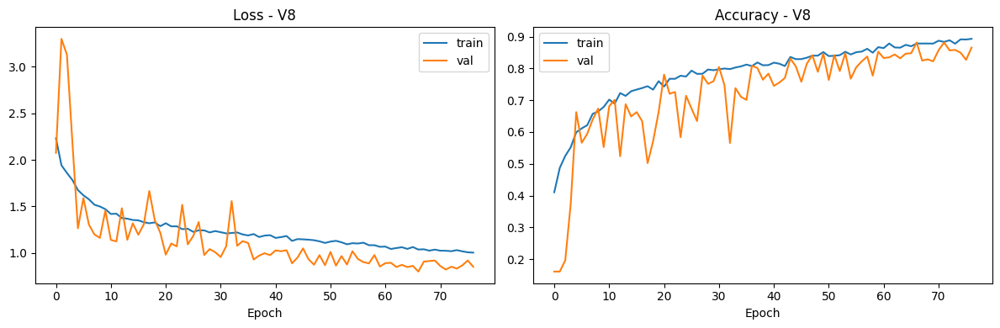

In [67]:
fig, axes = plt.subplots(1, 2, figsize=(12, 4))

axes[0].plot(history_v8.history['loss'], label='train')
axes[0].plot(history_v8.history['val_loss'], label='val')
axes[0].set_title('Loss - V8')
axes[0].set_xlabel('Epoch')
axes[0].legend()

axes[1].plot(history_v8.history['accuracy'], label='train')
axes[1].plot(history_v8.history['val_accuracy'], label='val')
axes[1].set_title('Accuracy - V8')
axes[1].set_xlabel('Epoch')
axes[1].legend()

plt.tight_layout()
plt.show()

### Validation Set Evaluation (Model Selection)

In [78]:
y_pred_v8_val = np.argmax(cnn_v8.predict(X_val_norm), axis=1)
print(classification_report(y_val, y_pred_v8_val, target_names=class_names))

39/39 [==============================] - 1s 27ms/step
              precision    recall  f1-score   support

       cloud       0.83      0.98      0.90       233
        dust       0.90      0.74      0.81       202
        haze       0.82      0.88      0.85       200
        land       0.93      0.88      0.91       206
     seaside       0.97      0.97      0.97       201
       smoke       0.86      0.83      0.84       203

    accuracy                           0.88      1245
   macro avg       0.89      0.88      0.88      1245
weighted avg       0.89      0.88      0.88      1245



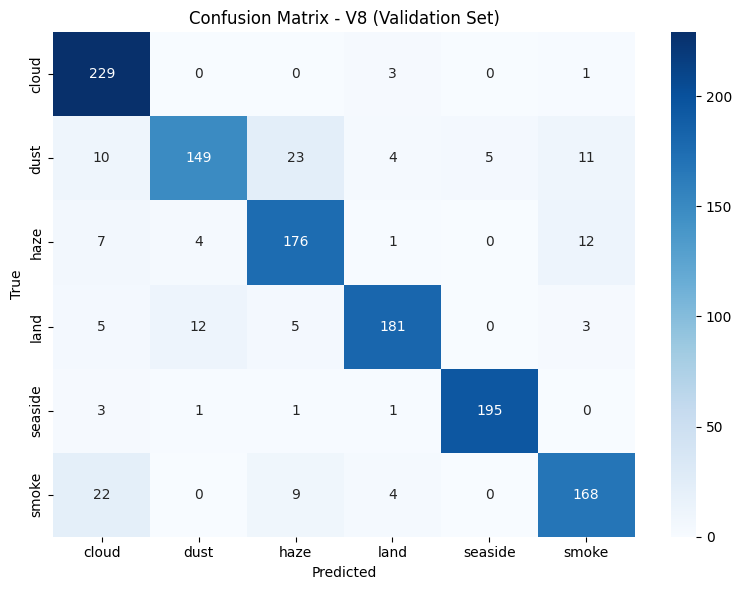

In [79]:
cm_v8_val = confusion_matrix(y_val, y_pred_v8_val)
fig, ax = plt.subplots(figsize=(8, 6))
sns.heatmap(cm_v8_val, annot=True, fmt="d", cmap="Blues",
            xticklabels=class_names, yticklabels=class_names, ax=ax)
ax.set_xlabel("Predicted")
ax.set_ylabel("True")
ax.set_title("Confusion Matrix - V8 (Validation Set)")
plt.tight_layout()
plt.show()

### Test Set Evaluation (Final Result)

In [35]:
y_pred_v8 = np.argmax(cnn_v8.predict(X_test_norm), axis=1)
print(classification_report(y_test, y_pred_v8, target_names=class_names))

39/39 [==============================] - 13s 40ms/step
              precision    recall  f1-score   support

       cloud       0.85      0.96      0.91       233
        dust       0.92      0.76      0.83       202
        haze       0.80      0.86      0.83       200
        land       0.89      0.90      0.90       205
     seaside       0.97      0.94      0.96       202
       smoke       0.87      0.85      0.86       203

    accuracy                           0.88      1245
   macro avg       0.89      0.88      0.88      1245
weighted avg       0.88      0.88      0.88      1245



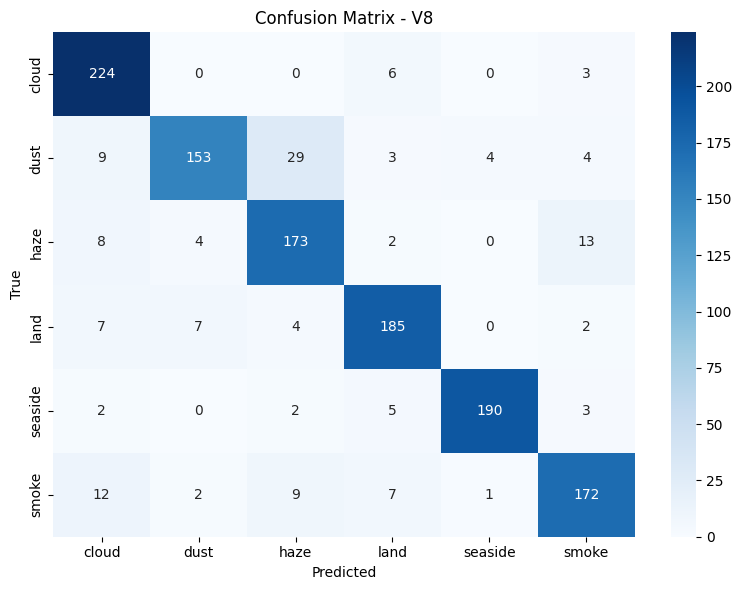

In [36]:
cm_v8 = confusion_matrix(y_test, y_pred_v8)
fig, ax = plt.subplots(figsize=(8, 6))
sns.heatmap(cm_v8, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_names, yticklabels=class_names, ax=ax)
ax.set_xlabel('Predicted')
ax.set_ylabel('True')
ax.set_title('Confusion Matrix - V8')
plt.tight_layout()
plt.show()

In [3]:
# ╔══════════════════════════════════════════════════════════════════╗
# ║  ⚠  LOAD CELL — REMOVE THIS CELL BEFORE HAND-IN               ║
# ║  In development: comment out the training cell above and        ║
# ║  run this cell instead to skip re-training.                     ║
# ╚══════════════════════════════════════════════════════════════════╝
cnn_v8 = tf.keras.models.load_model('tuned_models/cnn_v8_best.h5', compile=False)
print('Model loaded: tuned_models/cnn_v8_best.h5')


Model loaded: tuned_models/cnn_v8_best.h5


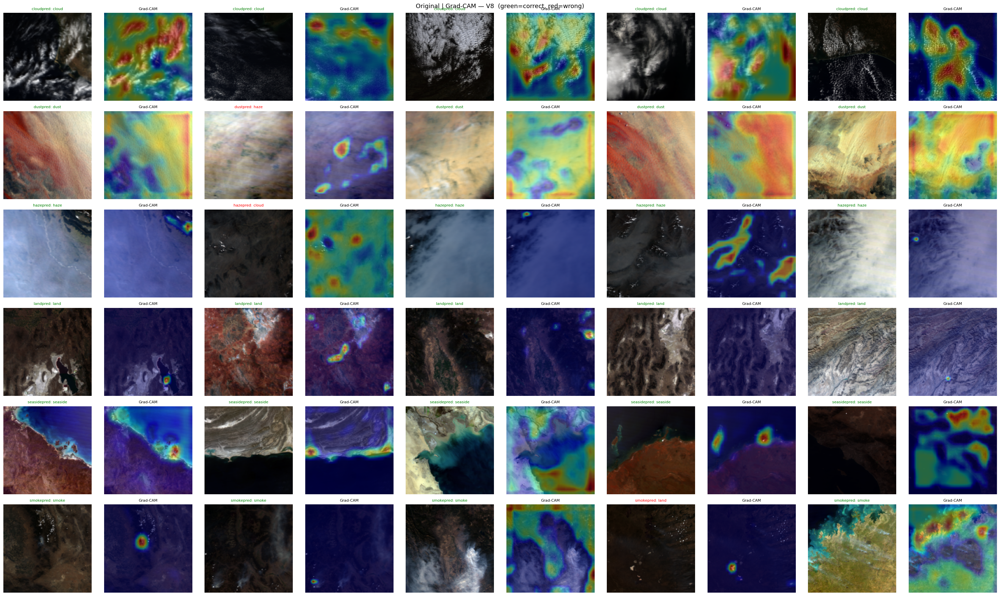

In [63]:
N_PER_CLASS = 5

last_conv_v8 = [l.name for l in cnn_v8.layers if isinstance(l, tf.keras.layers.Conv2D)][-1]

fig, axes = plt.subplots(len(class_names), N_PER_CLASS * 2, figsize=(N_PER_CLASS * 6, len(class_names) * 3))

for row, class_name in enumerate(class_names):
    class_idx = class_names.index(class_name)
    idxs = np.where(y_test == class_idx)[0][:N_PER_CLASS]
    for col, idx in enumerate(idxs):
        img = X_test_norm[idx]
        heatmap, pred = gradcam(cnn_v8, img, last_conv_v8)
        overlay = overlay_heatmap(img, heatmap)
        correct = pred == class_idx
        color = "green" if correct else "red"

        ax_orig = axes[row, col * 2]
        ax_orig.imshow(img)
        ax_orig.set_title(f"{class_name}pred: {class_names[pred]}", fontsize=8, color=color)
        for spine in ax_orig.spines.values():
            spine.set_edgecolor(color)
            spine.set_linewidth(2)
        ax_orig.axis("off")

        ax_cam = axes[row, col * 2 + 1]
        ax_cam.imshow(overlay)
        ax_cam.set_title("Grad-CAM", fontsize=8)
        ax_cam.axis("off")

plt.suptitle("Original | Grad-CAM — V8  (green=correct, red=wrong)", fontsize=13)
plt.tight_layout()
plt.show()


## Error Analysis — V8 (M2)

This section forms the basis of Section 6.2 of the paper. We focus on the **smoke class**, since recall on smoke is the primary evaluation criterion.

Three things are shown:
1. Misclassification breakdown — how many smoke images V8 still gets wrong and what they are predicted as
2. Grad-CAM on **misclassified** smoke images — where is the model looking when it fails?
3. Grad-CAM on **correctly classified** smoke images — for comparison: where does it look when it succeeds?

### 1 — Smoke Misclassification Breakdown

In [37]:
y_pred_v8 = np.argmax(cnn_v8.predict(X_test_norm), axis=1)

smoke_idx = class_names.index("smoke")
last_conv_v8 = [l.name for l in cnn_v8.layers if isinstance(l, tf.keras.layers.Conv2D)][-1]

smoke_mask   = y_test == smoke_idx
smoke_wrong  = np.where(smoke_mask & (y_pred_v8 != smoke_idx))[0]
smoke_right  = np.where(smoke_mask & (y_pred_v8 == smoke_idx))[0]

print(f"Smoke images in test set : {smoke_mask.sum()}")
print(f"Correctly classified     : {len(smoke_right)} ({len(smoke_right)/smoke_mask.sum():.1%})")
print(f"Misclassified            : {len(smoke_wrong)} ({len(smoke_wrong)/smoke_mask.sum():.1%})")
print()
print("Smoke misclassified as:")
for cls_idx, cls_name in enumerate(class_names):
    count = (y_pred_v8[smoke_wrong] == cls_idx).sum()
    if count > 0:
        print(f"  {cls_name:<10}: {count}")

39/39 [==============================] - 1s 36ms/step
Smoke images in test set : 203
Correctly classified     : 172 (84.7%)
Misclassified            : 31 (15.3%)

Smoke misclassified as:
  cloud     : 12
  dust      : 2
  haze      : 9
  land      : 7
  seaside   : 1


### 2 — Grad-CAM: Misclassified Smoke Images

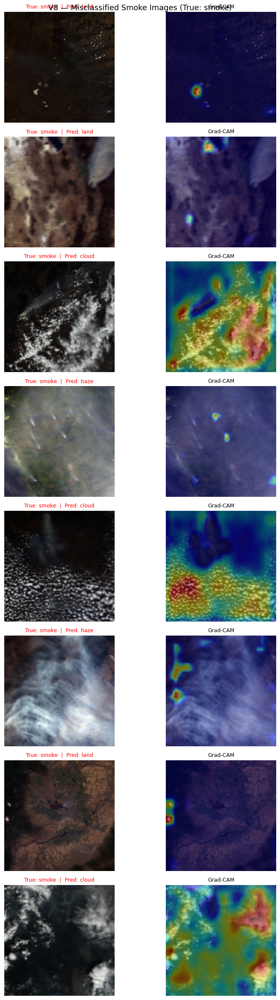

In [38]:
n_show = min(len(smoke_wrong), 8)

if n_show == 0:
    print("No misclassified smoke images — perfect recall!")
else:
    fig, axes = plt.subplots(n_show, 2, figsize=(9, n_show * 3))
    if n_show == 1:
        axes = axes[np.newaxis, :]

    for i, idx in enumerate(smoke_wrong[:n_show]):
        img = X_test_norm[idx]
        heatmap, pred = gradcam(cnn_v8, img, last_conv_v8)
        overlay = overlay_heatmap(img, heatmap)

        axes[i, 0].imshow(img)
        axes[i, 0].set_title(f"True: smoke  |  Pred: {class_names[pred]}", fontsize=9, color="red")
        axes[i, 0].axis("off")

        axes[i, 1].imshow(overlay)
        axes[i, 1].set_title("Grad-CAM", fontsize=9)
        axes[i, 1].axis("off")

    plt.suptitle("V8 — Misclassified Smoke Images (True: smoke)", fontsize=13)
    plt.tight_layout()
    plt.show()

### 3 — Grad-CAM: Correctly Classified Smoke Images

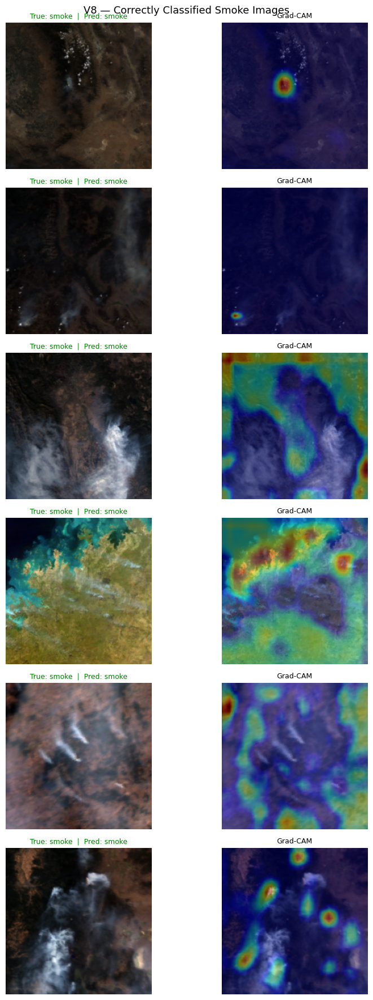

In [39]:
n_show = min(len(smoke_right), 6)

fig, axes = plt.subplots(n_show, 2, figsize=(9, n_show * 3))
if n_show == 1:
    axes = axes[np.newaxis, :]

for i, idx in enumerate(smoke_right[:n_show]):
    img = X_test_norm[idx]
    heatmap, pred = gradcam(cnn_v8, img, last_conv_v8)
    overlay = overlay_heatmap(img, heatmap)

    axes[i, 0].imshow(img)
    axes[i, 0].set_title("True: smoke  |  Pred: smoke", fontsize=9, color="green")
    axes[i, 0].axis("off")

    axes[i, 1].imshow(overlay)
    axes[i, 1].set_title("Grad-CAM", fontsize=9)
    axes[i, 1].axis("off")

plt.suptitle("V8 — Correctly Classified Smoke Images", fontsize=13)
plt.tight_layout()
plt.show()